In [38]:
!pip -q install transformers accelerate

In [62]:
from transformers import Qwen2_5_VLForConditionalGeneration
from transformers import AutoProcessor
from transformers import BitsAndBytesConfig

import torch

model_name = "Qwen/Qwen2.5-VL-7B-Instruct"

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16,
)

model_prompts = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    model_name,
    device_map="auto")

processor = AutoProcessor.from_pretrained(model_name)

config.json:   0%|          | 0.00/1.37k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/57.6k [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/729 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/216 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

In [ ]:
!pip -q install munch

In [39]:
import os
import shutil
import random
import gc
import re

from peft import LoraConfig, get_peft_model
import torch
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
import torchvision as tv
from data_qwen import *
from itertools import cycle
from tqdm import tqdm
import numpy as np
from util_data import SUBSET_NAMES, TEMPLATES_SMALL

In [14]:
def fix_random_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

def get_dataset_name_for_template(dataset):
    dataset_name = {
        "imagenet_100": "",
        "imagenet": "",
        "std10": "",
        "pets": "pet ",
        "fgvc_aircraft": "aircraft ",
        "cars": "car ",
        "eurosat": "satellite ",
        "dtd": "texture ",
        "flowers102": "flower ",
        "food101": "food ",
        "sun397": "scene ",
        "caltech101": "",
    }[dataset]
    return dataset_name

@torch.no_grad()
def get_mu_and_kappa(model, dataset):
    dataset_name = get_dataset_name_for_template(dataset)
    templates = TEMPLATES_SMALL

    all_mus =[]
    all_kappas =[]

    for class_name in SUBSET_NAMES[dataset]:
        class_texts =[]
        for template in templates:
            class_texts.append({"text": template.format(dataset_name, class_name) + "."})

        class_embs = model.process(class_texts)
        class_embs = F.normalize(class_embs, dim=-1)

        mu = class_embs.mean(dim=0)
        D = mu.shape[0]
        R = mu.norm()

        mu = mu / R
        kappa = (R * (D - R**2)) / torch.clamp(1 - R**2, min=1e-6)

        all_mus.append(mu)
        all_kappas.append(kappa)

    all_mus = torch.stack(all_mus)
    all_kappas = torch.stack(all_kappas)

    return all_mus, all_kappas

def get_image_embedding(model, images):
    image_inputs = [{"image": img} for img in images]
    image_embs = model.process(image_inputs)
    image_embs = F.normalize(image_embs, dim=-1)
    return image_embs


def get_acc(model, data_loader, mu, logit_scale, device):
    model.model.to(device)
    mu.to(device)
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Evaluating"):
            labels = labels.to(device)
            image_embedding = get_image_embedding(model, images)
            # compute similarity and predict
            similarity = logit_scale * (image_embedding @ mu.T)
            preds = similarity.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    return correct / total

def sample_tangent_gaussian(mu, kappa, num_samples, kappa_scale=0.05, kappa_max=500.0):
    C, D = mu.shape
    device = mu.device

    kappa = kappa * kappa_scale
    kappa = torch.clamp(kappa, min=1.0, max=kappa_max)

    eps = torch.randn((C, num_samples, D), device=device, dtype=mu.dtype)

    mu_expanded = mu.unsqueeze(1)
    dot_product = (eps * mu_expanded).sum(dim=-1, keepdim=True)
    eps = eps - dot_product * mu_expanded

    kappa_expanded = kappa.view(C, 1, 1)
    eps = eps / torch.sqrt(kappa_expanded)

    samples = mu_expanded + eps
    samples = F.normalize(samples, p=2, dim=-1)

    return samples

def build_text_distribution_samples(mu, kappa, num_samples=30, kappa_scale=0.05, kappa_max=500.0):
    C, D = mu.shape
    device = mu.device
    dtype = mu.dtype
    kappa = kappa * kappa_scale
    kappa = torch.clamp(kappa, min=1.0, max=kappa_max)
    eps = torch.randn((C, num_samples, D), device=device, dtype=dtype)
    mu_expanded = mu.unsqueeze(1)
    dot_product = (eps * mu_expanded).sum(dim=-1, keepdim=True)
    eps_tangent = eps - dot_product * mu_expanded
    kappa_expanded = kappa.view(C, 1, 1)
    eps_scaled = eps_tangent / torch.sqrt(kappa_expanded + 1e-6)
    samples = mu_expanded + eps_scaled
    samples = F.normalize(samples, p=2, dim=-1)

    return samples

def logit_from_h_vectorized(logit_scale, image_feats, centroids, area_index, chosen_centroids):
    logits_base = logit_scale * (image_feats @ centroids.t())
    logits_samples = logit_scale * (image_feats @ chosen_centroids.t())
    S = chosen_centroids.shape[0]
    logits_all = logits_base.unsqueeze(0).repeat(S, 1, 1)
    logits_all[:, :, area_index] = logits_samples.t()

    return logits_all

def compute_reg_vectorized(logit_scale, area_index, samples, feats_i, centroids):
    if feats_i.shape[0] == 0:
        return torch.tensor(0.0, device=feats_i.device)

    sampled_centroids = samples[area_index]
    logits_all = logit_from_h_vectorized(logit_scale, feats_i, centroids, area_index, sampled_centroids)
    logits_flat = logits_all.reshape(-1, logits_all.size(-1))
    labels_flat = torch.full((logits_flat.size(0),), area_index, device=feats_i.device, dtype=torch.long)

    return F.cross_entropy(logits_flat, labels_flat)

def train_one_epoch_update(
    model,
    opt_h,
    scaler,
    step,
    fewshot_train_loader,
    loader_iter_G,
    lamda1,
    lamda2,
    lamda3,
    writer,
    device,
    dataset="dtd",
    logit_scale=15
):
    model.model.train()

    for real_images, real_labels in tqdm(fewshot_train_loader):
        step += 1
        synth_images, synth_labels = next(loader_iter_G)
        real_labels = real_labels.to(device)
        synth_labels = synth_labels.to(device)
        mu, kappa = get_mu_and_kappa(model, dataset)
        torch.cuda.empty_cache()
        with torch.amp.autocast('cuda'):
            real_imgs_embedding = get_image_embedding(model, real_images)
            synth_imgs_embedding = get_image_embedding(model, synth_images)
            logits_real_all = logit_scale * (real_imgs_embedding @ mu.t())
            logits_synth_all = logit_scale * (synth_imgs_embedding @ mu.t())

            samples = build_text_distribution_samples(mu, kappa, num_samples=30)

        log_metrics = {"br": 0, "rr": 0, "bs": 0, "rs": 0}

        with torch.amp.autocast('cuda'):
            loss_real = F.cross_entropy(logits_real_all, real_labels)
            loss_synth = F.cross_entropy(logits_synth_all, synth_labels)

            total_loss = loss_real + lamda1 * loss_synth

            log_metrics["br"] = loss_real.item()
            log_metrics["bs"] = loss_synth.item()

        reg_losses =[]
        log_rr, log_rs = 0, 0

        present_classes = torch.cat([real_labels, synth_labels]).unique()
        number_of_classes = len(present_classes)

        with torch.amp.autocast('cuda'):
            for c_id_tensor in present_classes:
                c_id = c_id_tensor.item()

                r_idx = (real_labels == c_id).nonzero(as_tuple=True)[0]
                s_idx = (synth_labels == c_id).nonzero(as_tuple=True)[0]

                if len(r_idx) > 0:
                    l_reg_r = compute_reg_vectorized(
                        logit_scale=logit_scale,
                        area_index=c_id,
                        samples=samples,
                        feats_i=real_imgs_embedding[r_idx],
                        centroids=mu
                    )
                    reg_losses.append(lamda2 * l_reg_r / number_of_classes)
                    log_rr += l_reg_r.item() / number_of_classes

                if len(s_idx) > 0:
                    l_reg_s = compute_reg_vectorized(
                        logit_scale=logit_scale,
                        area_index=c_id,
                        samples=samples,
                        feats_i=synth_imgs_embedding[s_idx],
                        centroids=mu
                    )
                    reg_losses.append(lamda3 * l_reg_s / number_of_classes)
                    log_rs += l_reg_s.item() / number_of_classes

            if reg_losses:
                total_loss = total_loss + torch.sum(torch.stack(reg_losses))
        print(f'Total loss {total_loss.item()}')
        opt_h.zero_grad(set_to_none=True)
        scaler.scale(total_loss).backward()
        scaler.step(opt_h)
        scaler.update()

        writer.add_scalar("Loss_Batch/Real_Base", log_metrics["br"], step)
        writer.add_scalar("Loss_Batch/Real_Reg", log_rr, step)
        writer.add_scalar("Loss_Batch/Synth_Base", log_metrics["bs"], step)
        writer.add_scalar("Loss_Batch/Synth_Reg", log_rs, step)
        writer.add_scalar("Loss_Batch/Total", total_loss.item(), step)

        del total_loss, logits_real_all, logits_synth_all, samples

    return step

In [31]:
from PIL import Image
import os

def load_images(image_paths):

    images = []

    for path in image_paths:
        img = Image.open(path).convert("RGB")
        images.append(img)

    return images

In [35]:
def save_prompts(prompts, save_path):

    with open(save_path, "w") as f:
        json.dump(prompts, f)

In [ ]:
#Making train/test/synth dir
os.makedirs("/content/train", exist_ok=True)

In [ ]:
real_train_data_dir = "/content/"

In [151]:
dataset = 'fgvc_aircraft'
n_samples_per_class = 16

device = "cuda" if torch.cuda.is_available() else "cpu"

model_type = "qwen"

fix_random_seed(0)
fewshot_train_loader, test_loader = get_data_loader(
        real_train_data_dir='/content/',
        real_test_data_dir="/content/",
        dataset=dataset,
        bs=32,
        eval_bs=128,
        n_img_per_cls=16,
        model_type=model_type,
    )

16


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 18 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


In [ ]:

def run_qwen(messages, max_new_tokens=1024):

    text = processor.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
    )

    image_inputs = []

    for msg in messages:
        for item in msg["content"]:
            if item["type"] == "image":
                image_inputs.append(item["image"])

    inputs = processor(
        text=[text],
        images=image_inputs if len(image_inputs) > 0 else None,
        padding=True,
        return_tensors="pt"
    ).to(model_prompts.device)

    generated_ids = model_prompts.generate(
        **inputs,
        max_new_tokens=max_new_tokens,
        do_sample=True,
        temperature=0.7,
        top_p=0.9
    )

    generated_ids_trimmed = [
        out_ids[len(in_ids):]
        for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
    ]

    output_text = processor.batch_decode(
        generated_ids_trimmed,
        skip_special_tokens=True,
        clean_up_tokenization_spaces=False
    )[0]

    return output_text

# Stage 1 — Global label-space reasoning

Mục tiêu:

- cho Qwen biết toàn bộ/batch label space
- xác định confusing pairs
- xác định discriminative axes


In [41]:
train_transform, test_transform = get_transforms('qwen')

In [42]:
classes = SUBSET_NAMES[dataset]
classes[:5]

['707-320', '727-200', '737-200', '737-300', '737-400']

In [43]:
len(fewshot_train_loader.dataset)

1600

In [68]:
n_img_per_cls = 16
fix_random_seed(0)
# Thay train_dataset theo cách tạo train_dataset
# tương ứng của data đang phụ trách trong util_data
train_dataset = tv.datasets.FGVCAircraft(
                root= '/content',
                split='trainval',
                annotation_level='variant',
                transform=train_transform,
                download=True,
            )
train_dataset = filter_dset(dataset=train_dataset,
                            n_img_per_cls=n_img_per_cls,
                            dataset_name=dataset)

16


In [69]:
print(train_dataset._image_files[:5])

['/content/fgvc-aircraft-2013b/data/images/0732667.jpg', '/content/fgvc-aircraft-2013b/data/images/0198101.jpg', '/content/fgvc-aircraft-2013b/data/images/1042824.jpg', '/content/fgvc-aircraft-2013b/data/images/0064933.jpg', '/content/fgvc-aircraft-2013b/data/images/0062781.jpg']


In [70]:
print(train_dataset._labels[:16])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [50]:
print(train_dataset._labels[16:33])

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2]


In [71]:
data = train_dataset._image_files # paths of real few-shot image

In [72]:
print(len(data)) # 16 x n_class

1600


In [73]:
print(data[10:20])

['/content/fgvc-aircraft-2013b/data/images/1152266.jpg', '/content/fgvc-aircraft-2013b/data/images/0864665.jpg', '/content/fgvc-aircraft-2013b/data/images/0687610.jpg', '/content/fgvc-aircraft-2013b/data/images/0729223.jpg', '/content/fgvc-aircraft-2013b/data/images/0887066.jpg', '/content/fgvc-aircraft-2013b/data/images/1082409.jpg', '/content/fgvc-aircraft-2013b/data/images/0875317.jpg', '/content/fgvc-aircraft-2013b/data/images/0901504.jpg', '/content/fgvc-aircraft-2013b/data/images/1862134.jpg', '/content/fgvc-aircraft-2013b/data/images/1036881.jpg']


In [74]:
import os
import random
from collections import defaultdict
# Tạo dict paths của real images theo lớp, paths chứa thông tin lớp
def build_fewshot_dict(
    all_image_paths,
    num_shots=16,
    seed=42,
):
    random.seed(seed)
    # class_name -> list paths
    class_to_paths = defaultdict(list)

    # -----------------------------------------------------
    # GROUP PATHS BY CLASS
    # -----------------------------------------------------

    for path in all_image_paths:

        # Example:
        # /content/train/eurosat/2750/AnnualCrop/xxx.jpg
        #
        # class_name = AnnualCrop

        class_name = str(path).split("/")[-2]

        class_to_paths[class_name].append(path)

    # -----------------------------------------------------
    # SAMPLE FEWSHOT
    # -----------------------------------------------------

    fewshot_dict = {}

    for class_name, paths in class_to_paths.items():

        # shuffle
        random.shuffle(paths)

        # lấy num_shots ảnh
        selected = paths[:num_shots]

        fewshot_dict[class_name] = selected

    return fewshot_dict

In [75]:
def build_fewshot_dict(
    all_image_paths,
    class_names,
    num_shots=16,
):
    """
    Giả sử:
        - Mỗi lớp có đúng num_shots ảnh
        - Các ảnh được sắp xếp liên tiếp theo lớp

    Ví dụ:
        paths[0:16]   -> class_names[0]
        paths[16:32]  -> class_names[1]
        paths[32:48]  -> class_names[2]
        ...
    """

    fewshot_dict = {}

    for class_idx, class_name in enumerate(class_names):

        start_idx = class_idx * num_shots
        end_idx = start_idx + num_shots

        fewshot_dict[class_name] = all_image_paths[start_idx:end_idx]

    return fewshot_dict

In [76]:
fewshot_dict = build_fewshot_dict(
    data,
    class_names=classes,
    num_shots=16,
)

In [77]:
#few-shot dict: {class_name: [list of paths]}
print("=" * 60)
print("Few-shot image paths per class")
print("=" * 60)
for class_name, image_paths in fewshot_dict.items():
    print("\nCLASS:", class_name)
    print("Num images:", len(image_paths))
    for p in image_paths[:5]:
        print(p)

Few-shot image paths per class

CLASS: 707-320
Num images: 16
/content/fgvc-aircraft-2013b/data/images/0732667.jpg
/content/fgvc-aircraft-2013b/data/images/0198101.jpg
/content/fgvc-aircraft-2013b/data/images/1042824.jpg
/content/fgvc-aircraft-2013b/data/images/0064933.jpg
/content/fgvc-aircraft-2013b/data/images/0062781.jpg

CLASS: 727-200
Num images: 16
/content/fgvc-aircraft-2013b/data/images/0875317.jpg
/content/fgvc-aircraft-2013b/data/images/0901504.jpg
/content/fgvc-aircraft-2013b/data/images/1862134.jpg
/content/fgvc-aircraft-2013b/data/images/1036881.jpg
/content/fgvc-aircraft-2013b/data/images/0730793.jpg

CLASS: 737-200
Num images: 16
/content/fgvc-aircraft-2013b/data/images/0438655.jpg
/content/fgvc-aircraft-2013b/data/images/0536510.jpg
/content/fgvc-aircraft-2013b/data/images/0548186.jpg
/content/fgvc-aircraft-2013b/data/images/0091362.jpg
/content/fgvc-aircraft-2013b/data/images/0923506.jpg

CLASS: 737-300
Num images: 16
/content/fgvc-aircraft-2013b/data/images/1110775.j

In [33]:
import random

def sample_images(
    fewshot_dict,
    class_name,
    k=5,
    random_sample=True,
    seed=42
):
    """
    Args:
        fewshot_dict:
            dict[class_name] -> list of image paths

        class_name:
            target class name

        k:
            number of sampled images

        random_sample:
            whether to random sample

        seed:
            random seed

    Returns:
        list of image paths
    """

    if class_name not in fewshot_dict:
        raise ValueError(
            f"{class_name} not found in fewshot_dict"
        )

    image_paths = fewshot_dict[class_name]

    if len(image_paths) == 0:
        raise ValueError(
            f"No images found for class {class_name}"
        )

    k = min(k, len(image_paths))

    if random_sample:
        random.seed(seed)
        sampled = random.sample(image_paths, k)
    else:

        sampled = image_paths[:k]

    return sampled

In [ ]:
sample_images(fewshot_dict, classes[0], k=5)

['/content/fgvc-aircraft-2013b/data/images/0064933.jpg',
 '/content/fgvc-aircraft-2013b/data/images/0732667.jpg',
 '/content/fgvc-aircraft-2013b/data/images/0864665.jpg',
 '/content/fgvc-aircraft-2013b/data/images/0062781.jpg',
 '/content/fgvc-aircraft-2013b/data/images/1082409.jpg']

In [ ]:
for class_name, image_paths in fewshot_dict.items():
  print(class_name)
  print(image_paths)
  break

707-320
['/content/fgvc-aircraft-2013b/data/images/0732667.jpg', '/content/fgvc-aircraft-2013b/data/images/0198101.jpg', '/content/fgvc-aircraft-2013b/data/images/1042824.jpg', '/content/fgvc-aircraft-2013b/data/images/0064933.jpg', '/content/fgvc-aircraft-2013b/data/images/0062781.jpg', '/content/fgvc-aircraft-2013b/data/images/0482761.jpg', '/content/fgvc-aircraft-2013b/data/images/1042021.jpg', '/content/fgvc-aircraft-2013b/data/images/0577855.jpg', '/content/fgvc-aircraft-2013b/data/images/0536721.jpg', '/content/fgvc-aircraft-2013b/data/images/0901498.jpg', '/content/fgvc-aircraft-2013b/data/images/1152266.jpg', '/content/fgvc-aircraft-2013b/data/images/0864665.jpg', '/content/fgvc-aircraft-2013b/data/images/0687610.jpg', '/content/fgvc-aircraft-2013b/data/images/0729223.jpg', '/content/fgvc-aircraft-2013b/data/images/0887066.jpg', '/content/fgvc-aircraft-2013b/data/images/1082409.jpg']


In [ ]:
fewshot_dict.keys()

dict_keys(['707-320', '727-200', '737-200', '737-300', '737-400', '737-500', '737-600', '737-700', '737-800', '737-900', '747-100', '747-200', '747-300', '747-400', '757-200', '757-300', '767-200', '767-300', '767-400', '777-200', '777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200', 'A340-300', 'A340-500', 'A340-600', 'A380', 'ATR-42', 'ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125', 'Beechcraft 1900', 'Boeing 717', 'C-130', 'C-47', 'CRJ-200', 'CRJ-700', 'CRJ-900', 'Cessna 172', 'Cessna 208', 'Cessna 525', 'Cessna 560', 'Challenger 600', 'DC-10', 'DC-3', 'DC-6', 'DC-8', 'DC-9-30', 'DH-82', 'DHC-1', 'DHC-6', 'DHC-8-100', 'DHC-8-300', 'DR-400', 'Dornier 328', 'E-170', 'E-190', 'E-195', 'EMB-120', 'ERJ 135', 'ERJ 145', 'Embraer Legacy 600', 'Eurofighter Typhoon', 'F-16A/B', 'F/A-18', 'Falcon 2000', 'Falcon 900', 'Fokker 100', 'Fokker 50', 'Fokker 70', 'Global Express', 'Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD

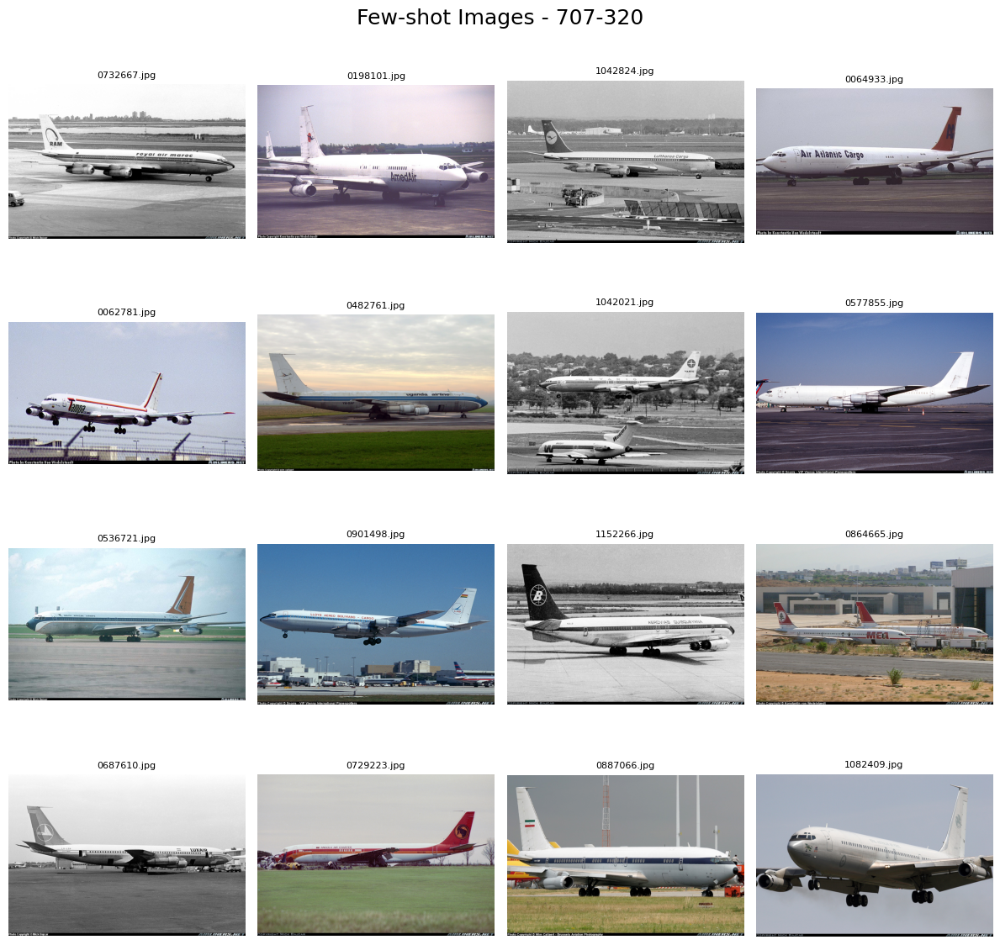

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# ===== visualize =====
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()
for idx, path in enumerate(fewshot_dict[classes[0]]):
    img = Image.open(path).convert("RGB")
    axes[idx].imshow(img)
    # chỉ hiện tên file
    file_name = str(path).split("/")[-1]
    axes[idx].set_title(file_name, fontsize=8)
    axes[idx].axis("off")
plt.suptitle(f"Few-shot Images - {classes[0]}", fontsize=18)
plt.tight_layout()
plt.show()

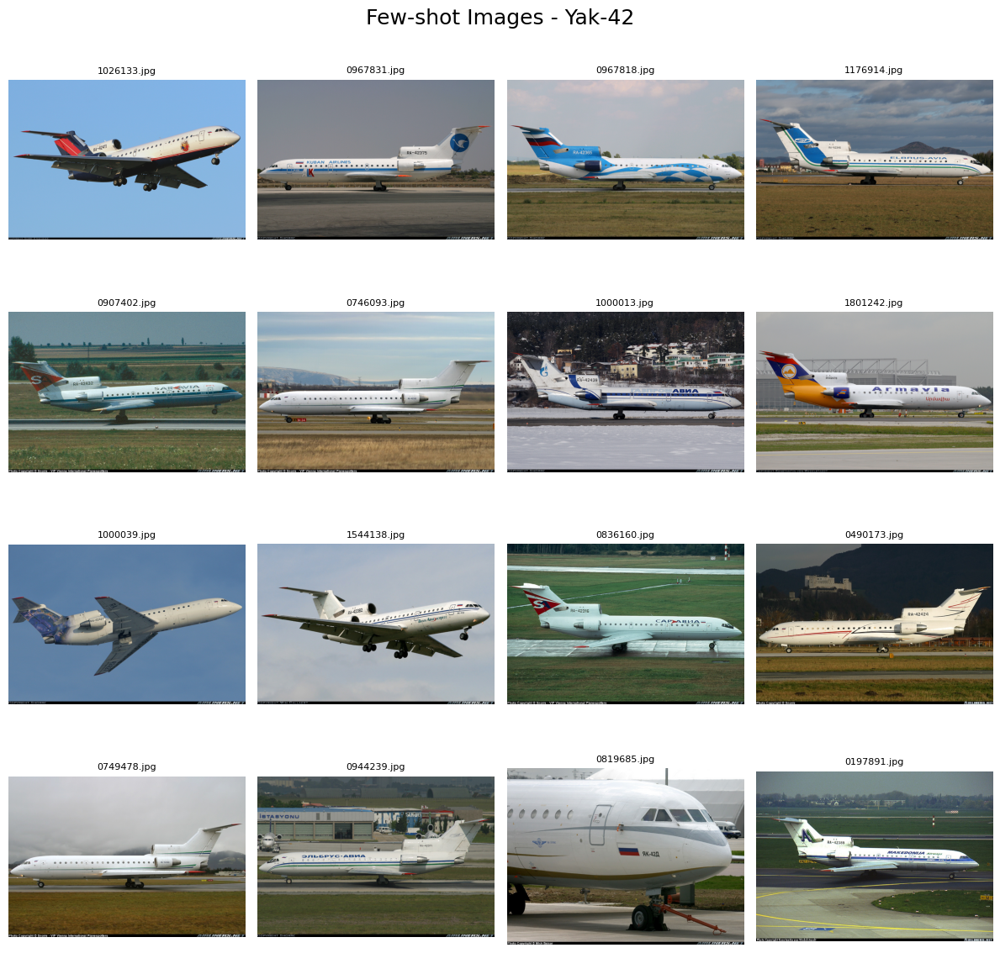

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# ===== visualize =====
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()
for idx, path in enumerate(fewshot_dict[classes[99]]):
    img = Image.open(path).convert("RGB")
    axes[idx].imshow(img)
    # chỉ hiện tên file
    file_name = str(path).split("/")[-1]
    axes[idx].set_title(file_name, fontsize=8)
    axes[idx].axis("off")
plt.suptitle(f"Few-shot Images - {classes[99]}", fontsize=18)
plt.tight_layout()
plt.show()

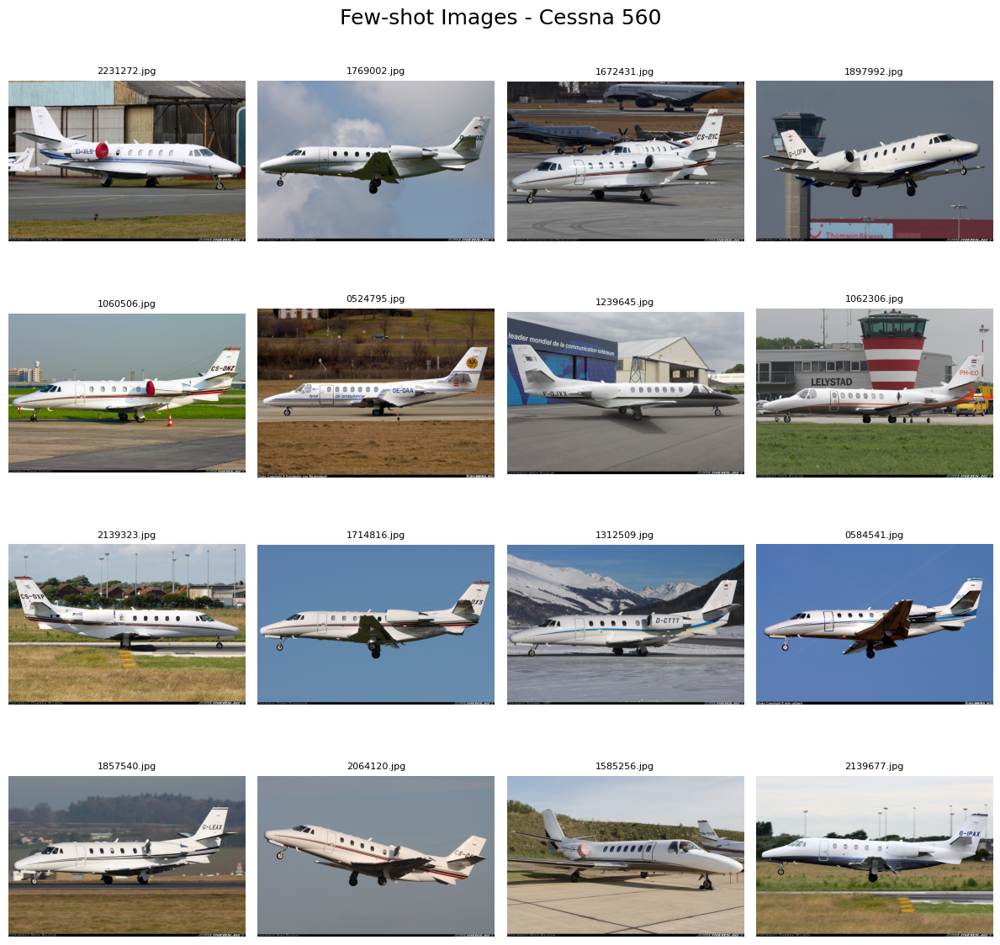

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# ===== visualize =====
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()
for idx, path in enumerate(fewshot_dict[classes[50]]):
    img = Image.open(path).convert("RGB")
    axes[idx].imshow(img)
    # chỉ hiện tên file
    file_name = str(path).split("/")[-1]
    axes[idx].set_title(file_name, fontsize=8)
    axes[idx].axis("off")
plt.suptitle(f"Few-shot Images - {classes[50]}", fontsize=18)
plt.tight_layout()
plt.show()

In [ ]:
def build_prompt(classes, num_descriptions=2):

    class_list = "\n".join(
        f"{i+1}. {cls}"
        for i, cls in enumerate(classes)
    )

    return f"""
You are an expert in visual recognition.

Generate exactly {num_descriptions} visual descriptions for EVERY class
in the following list:

{class_list}

IMPORTANT:
- Do not skip any class.
- Output every class exactly once.
- Use the class names exactly as provided.
- Preserve the same order as the input list.
- Each class must have exactly {num_descriptions} descriptions.

Descriptions within the same class should be diverse and complementary,
focusing on different observable visual characteristics.

Descriptions across classes should emphasize concrete visual features
that distinguish visually similar classes.

Use relevant attributes such as shape, structure, parts, proportions,
color, patterns, texture, or spatial arrangement.

Avoid definitions, non-visual information, generic wording,
technical specifications, and repeated descriptions.

Output only the requested classes in this exact order.

Format:

class_name:
description
description

class_name:
description
description
"""

In [60]:
from PIL import Image

def load_pil_images(paths):
    return [Image.open(p).convert("RGB") for p in paths]

In [ ]:
def generate_prompts(
    classes,
    max_new_tokens=5000,
    num_descriptions = 2
):

    prompt = build_prompt(classes, num_descriptions = num_descriptions)

    messages = [
        {
            "role": "user",
            "content": prompt
        }
    ]

    text = processor.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True
    )

    inputs = processor(
        text=[text],
        padding=True,
        return_tensors="pt"
    ).to(model_prompts.device)

    generated_ids = model_prompts.generate(
        **inputs,
        max_new_tokens=max_new_tokens,
        do_sample=True,
        temperature=0.8,
        top_p=0.95,
)


    generated_text = processor.batch_decode(
        generated_ids,
        skip_special_tokens=True
    )[0]

    return generated_text

In [ ]:
import re

def parse_class_prompts(text, class_names):

    class_prompts = {}

    # chỉ lấy phần assistant output
    if "assistant" in text:
        text = text.split("assistant", 1)[1]

    # bỏ markdown bold
    text = text.replace("**", "")

    # regex class names
    escaped = [re.escape(c) for c in class_names]

    class_pattern = "|".join(
        sorted(escaped, key=len, reverse=True)
    )

    pattern = rf"""
    ^({class_pattern})\s*:\s*$      # class name:
    (.*?)                           # content
    (?=^\s*(?:{class_pattern})\s*:\s*$|\Z)
    """

    matches = re.findall(
        pattern,
        text,
        re.MULTILINE | re.DOTALL | re.VERBOSE | re.IGNORECASE
    )

    for class_name, content in matches:

        prompts = []

        lines = content.strip().split("\n")

        for line in lines:

            line = line.strip()

            if not line:
                continue

            # bỏ bullet / numbering
            line = re.sub(r"^[-*]\s*", "", line)
            line = re.sub(r"^\d+\.\s*", "", line)

            # normalize spaces
            line = re.sub(r"\s+", " ", line)

            # bỏ câu quá ngắn
            if len(line) < 15:
                continue

            prompts.append(line)

        class_prompts[class_name.lower()] = prompts

    return class_prompts

In [ ]:
import re


def normalize_class_name(name):
    name = str(name).strip().lower()
    # Remove surrounding punctuation
    name = name.strip("'\": ")
    # Normalize all common separators
    name = re.sub(r"[\s\-_\/]+", "", name)
    return name


prompts_all = {cls: [] for cls in classes}

canonical_class_map = {
    normalize_class_name(cls): cls
    for cls in classes
}

batch_size = 10
class_batches = [
    classes[i:i + batch_size]
    for i in range(0, len(classes), batch_size)
]


In [ ]:
class_batches[0]

['707-320',
 '727-200',
 '737-200',
 '737-300',
 '737-400',
 '737-500',
 '737-600',
 '737-700',
 '737-800',
 '737-900']

In [ ]:
expected_num = 2
n_runs = 15

for run in tqdm(range(n_runs)):
  print(f"Run {run + 1}/{n_runs}")
  for batch_idx, class_batch in enumerate(class_batches):

    print(f"\nBatch {batch_idx + 1}/{len(class_batches)}")
    gen = generate_prompts(class_batch, num_descriptions = 2)
    gen_extract = parse_class_prompts(
        gen,
        class_names=class_batch
    )
    # Chuẩn hóa output
    normalized_output = {}
    for cls_extracted, prompts in gen_extract.items():
        norm_name = normalize_class_name(cls_extracted)
        normalized_output[norm_name] = prompts

    # Kiểm tra từng class
    missing_classes = []
    for cls in class_batch:
        norm_cls = normalize_class_name(cls)
        prompts = normalized_output.get(norm_cls, [])
        # Nếu thiếu mô tả
        if len(prompts) < expected_num:
            missing_classes.append(cls)
        # Gộp các prompt đã sinh được
        canonical_cls = canonical_class_map[norm_cls]
        prompts_all[canonical_cls].extend(prompts)
    print(
        f"Missing/incomplete classes: "
        f"{len(missing_classes)}"
    )
    print(missing_classes)
    if missing_classes:
      print(
        "Regenerating missing classes..."
    )
      retry_gen = generate_prompts(
        missing_classes
    )
      retry_extract = parse_class_prompts(
        retry_gen,
        class_names=missing_classes)

      for cls_extracted, prompts in retry_extract.items():
        norm_cls = normalize_class_name(
            cls_extracted)
        if norm_cls in canonical_class_map:
            canonical_cls = canonical_class_map[
                norm_cls
            ]
            # Chỉ lấy số lượng còn thiếu
            current_count = len(
                prompts_all[canonical_cls])
            remaining = expected_num - current_count
            if remaining > 0:
                prompts_all[canonical_cls].extend(
                    prompts[:remaining]
                )

  0%|          | 0/15 [00:00<?, ?it/s]

Run 1/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 0
[]

Batch 4/10
Missing/incomplete classes: 10
['A340-300', 'A340-500', 'A340-600', 'A380', 'ATR-42', 'ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125']
Regenerating missing classes...

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 0
[]

Batch 10/10


  7%|▋         | 1/15 [07:19<1:42:31, 439.39s/it]

Missing/incomplete classes: 0
[]
Run 2/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 1
['757-300']
Regenerating missing classes...

Batch 3/10
Missing/incomplete classes: 0
[]

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 0
[]

Batch 10/10


 13%|█▎        | 2/15 [12:07<1:15:55, 350.46s/it]

Missing/incomplete classes: 0
[]
Run 3/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 9
['747-100', '747-200', '747-300', '747-400', '757-200', '757-300', '767-300', '767-400', '777-200']
Regenerating missing classes...

Batch 3/10
Missing/incomplete classes: 10
['777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 10
['A340-300', 'A340-500', 'A340-600', 'A380', 'ATR-42', 'ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125']
Regenerating missing classes...

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 10
['Cessna 560', 'Challenger 600', 'DC-10', 'DC-3', 'DC-6', 'DC-8', 'DC-9-30', 'DH-82', 'DHC-1', 'DHC-6']
Regenerating missing classes...

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 10
['Gulfstream IV', '

 20%|██        | 3/15 [20:03<1:21:30, 407.55s/it]

Missing/incomplete classes: 0
[]
Run 4/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 10
['777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 0
[]

Batch 10/10


 27%|██▋       | 4/15 [25:22<1:08:21, 372.86s/it]

Missing/incomplete classes: 0
[]
Run 5/15

Batch 1/10
Missing/incomplete classes: 1
['737-900']
Regenerating missing classes...

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 10
['777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 10
['A340-300', 'A340-500', 'A340-600', 'A380', 'ATR-42', 'ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125']
Regenerating missing classes...

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 10
['Cessna 560', 'Challenger 600', 'DC-10', 'DC-3', 'DC-6', 'DC-8', 'DC-9-30', 'DH-82', 'DHC-1', 'DHC-6']
Regenerating missing classes...

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 10
['Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD-11', 'MD-80', 'MD-87', 'MD-90', 'Metrol

 33%|███▎      | 5/15 [34:47<1:13:39, 441.93s/it]

Run 6/15

Batch 1/10
Missing/incomplete classes: 10
['707-320', '727-200', '737-200', '737-300', '737-400', '737-500', '737-600', '737-700', '737-800', '737-900']
Regenerating missing classes...

Batch 2/10
Missing/incomplete classes: 4
['747-400', '757-300', '767-300', '767-400']
Regenerating missing classes...

Batch 3/10
Missing/incomplete classes: 10
['777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 9
['Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD-11', 'MD-80', 'MD-87', 'MD-90', 'Metroliner']
Regenerating missing classes...

Batch 10/10


 40%|████      | 6/15 [42:05<1:06:05, 440.65s/it]

Missing/incomplete classes: 0
[]
Run 7/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 10
['747-100', '747-200', '747-300', '747-400', '757-200', '757-300', '767-200', '767-300', '767-400', '777-200']
Regenerating missing classes...

Batch 3/10
Missing/incomplete classes: 0
[]

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 10
['Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD-11', 'MD-80', 'MD-87', 'MD-90', 'Metroliner']
Regenerating missing classes...

Batch 10/10


 47%|████▋     | 7/15 [48:25<56:07, 420.90s/it]  

Missing/incomplete classes: 0
[]
Run 8/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 0
[]

Batch 4/10
Missing/incomplete classes: 1
['A380']
Regenerating missing classes...

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 10
['Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD-11', 'MD-80', 'MD-87', 'MD-90', 'Metroliner']
Regenerating missing classes...

Batch 10/10
Missing/incomplete classes: 10
['Model B200', 'PA-28', 'SR-20', 'Saab 2000', 'Saab 340', 'Spitfire', 'Tornado', 'Tu-134', 'Tu-154', 'Yak-42']
Regenerating missing classes...


 53%|█████▎    | 8/15 [55:15<48:42, 417.55s/it]

Run 9/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 9
['A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 10
['A340-300', 'A340-500', 'A340-600', 'A380', 'ATR-42', 'ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125']
Regenerating missing classes...

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 10
['Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD-11', 'MD-80', 'MD-87', 'MD-90', 'Metroliner']
Regenerating missing classes...

Batch 10/10
Missing/incomplete classes: 9
['PA-28', 'SR-20', 'Saab 2000', 'Saab 340', 'Spitfire', 'Tornado', 'Tu-134', 'Tu-154', 'Yak-42']
Regenerating missing classes...


 60%|██████    | 9/15 [1:01:54<41:09, 411.59s/it]

Run 10/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 10
['747-100', '747-200', '747-300', '747-400', '757-200', '757-300', '767-200', '767-300', '767-400', '777-200']
Regenerating missing classes...

Batch 3/10
Missing/incomplete classes: 0
[]

Batch 4/10
Missing/incomplete classes: 10
['A340-300', 'A340-500', 'A340-600', 'A380', 'ATR-42', 'ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125']
Regenerating missing classes...

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 10
['Embraer Legacy 600', 'Eurofighter Typhoon', 'F-16A/B', 'F/A-18', 'Falcon 2000', 'Falcon 900', 'Fokker 100', 'Fokker 50', 'Fokker 70', 'Global Express']
Regenerating missing classes...

Batch 9/10
Missing/incomplete classes: 0
[]

Batch 10/10


 67%|██████▋   | 10/15 [1:10:02<36:15, 435.13s/it]

Missing/incomplete classes: 0
[]
Run 11/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 9
['A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 0
[]

Batch 10/10
Missing/incomplete classes: 10
['Model B200', 'PA-28', 'SR-20', 'Saab 2000', 'Saab 340', 'Spitfire', 'Tornado', 'Tu-134', 'Tu-154', 'Yak-42']
Regenerating missing classes...


 73%|███████▎  | 11/15 [1:16:50<28:27, 426.85s/it]

Run 12/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 10
['747-100', '747-200', '747-300', '747-400', '757-200', '757-300', '767-200', '767-300', '767-400', '777-200']
Regenerating missing classes...

Batch 3/10
Missing/incomplete classes: 0
[]

Batch 4/10
Missing/incomplete classes: 1
['ATR-72']
Regenerating missing classes...

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 10
['Cessna 560', 'Challenger 600', 'DC-10', 'DC-3', 'DC-6', 'DC-8', 'DC-9-30', 'DH-82', 'DHC-1', 'DHC-6']
Regenerating missing classes...

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 9
['Embraer Legacy 600', 'Eurofighter Typhoon', 'F-16A/B', 'F/A-18', 'Falcon 2000', 'Falcon 900', 'Fokker 100', 'Fokker 50', 'Fokker 70']
Regenerating missing classes...

Batch 9/10
Missing/incomplete classes: 0
[]

Batch 10/10


 80%|████████  | 12/15 [1:24:27<21:48, 436.01s/it]

Missing/incomplete classes: 0
[]
Run 13/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 10
['777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 10
['Cessna 560', 'Challenger 600', 'DC-10', 'DC-3', 'DC-6', 'DC-8', 'DC-9-30', 'DH-82', 'DHC-1', 'DHC-6']
Regenerating missing classes...

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 0
[]

Batch 10/10


 87%|████████▋ | 13/15 [1:30:38<13:52, 416.32s/it]

Missing/incomplete classes: 0
[]
Run 14/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 10
['777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 10
['Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD-11', 'MD-80', 'MD-87', 'MD-90', 'Metroliner']
Regenerating missing classes...

Batch 10/10


 93%|█████████▎| 14/15 [1:37:14<06:50, 410.24s/it]

Missing/incomplete classes: 0
[]
Run 15/15

Batch 1/10
Missing/incomplete classes: 0
[]

Batch 2/10
Missing/incomplete classes: 0
[]

Batch 3/10
Missing/incomplete classes: 10
['777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200']
Regenerating missing classes...

Batch 4/10
Missing/incomplete classes: 0
[]

Batch 5/10
Missing/incomplete classes: 0
[]

Batch 6/10
Missing/incomplete classes: 0
[]

Batch 7/10
Missing/incomplete classes: 0
[]

Batch 8/10
Missing/incomplete classes: 0
[]

Batch 9/10
Missing/incomplete classes: 10
['Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD-11', 'MD-80', 'MD-87', 'MD-90', 'Metroliner']
Regenerating missing classes...

Batch 10/10
Missing/incomplete classes: 10
['Model B200', 'PA-28', 'SR-20', 'Saab 2000', 'Saab 340', 'Spitfire', 'Tornado', 'Tu-134', 'Tu-154', 'Yak-42']
Regenerating missing classes...


100%|██████████| 15/15 [1:45:07<00:00, 420.50s/it]


In [ ]:
expected_num = 30

for cls, prompts in prompts_all.items():
    if len(prompts) != expected_num:
        print(
            f"{cls}: "
            f"{len(prompts)}/{expected_num}"
        )

737-800: 32/30
737-900: 28/30
747-100: 24/30
747-200: 24/30
747-300: 24/30
747-400: 21/30
757-200: 24/30
757-300: 20/30
767-200: 28/30
767-300: 21/30
767-400: 21/30
777-200: 23/30
777-300: 19/30
A300B4: 17/30
A310: 17/30
A318: 17/30
A319: 17/30
A320: 17/30
A321: 17/30
A330-200: 17/30
A330-300: 17/30
A340-200: 17/30
A340-300: 26/30
A340-500: 26/30
A380: 24/30
ATR-42: 26/30
ATR-72: 23/30
An-12: 26/30
BAE 146-200: 26/30
BAE 146-300: 26/30
BAE-125: 26/30
Cessna 560: 25/30
Challenger 600: 25/30
DC-10: 25/30
DC-3: 25/30
DC-6: 25/30
DC-8: 25/30
DC-9-30: 25/30
DH-82: 25/30
DHC-1: 25/30
DHC-6: 25/30
Dornier 328: 31/30
E-170: 31/30
E-190: 31/30
E-195: 31/30
EMB-120: 31/30
ERJ 135: 31/30
ERJ 145: 31/30
Embraer Legacy 600: 28/30
Eurofighter Typhoon: 28/30
F-16A/B: 28/30
F/A-18: 28/30
Falcon 2000: 28/30
Falcon 900: 28/30
Fokker 100: 28/30
Fokker 50: 28/30
Fokker 70: 28/30
Global Express: 29/30
Gulfstream IV: 23/30
Gulfstream V: 22/30
Hawk T1: 22/30
Il-76: 22/30
L-1011: 22/30
MD-11: 22/30
MD-80: 22/

In [ ]:
prompts_all['737-200']

['Small fuselage size suitable for short-haul routes, featuring short wings with no winglets.',
 'Traditional T-tail design but smaller in overall size than the 737-200 Next Generation (NG).',
 'Compact fuselage with two engines under the wings.',
 'Small size, ideal for short-haul flights, featuring a traditional two-engine layout.',
 'Narrow-body aircraft with sharp, angular nose',
 'Fuselage appears streamlined with evenly spaced windows',
 'Single-engine aircraft with a slender fuselage and a clean, modernized design, featuring a T-tail configuration and winglets at the wingtips.',
 'Short-haul passenger plane with a single-aisle cabin layout, designed for frequent short and medium-distance flights.',
 'Compact fuselage with a single engine mounted on the rear fuselage',
 'Conventional wing design without winglets and simple horizontal stabilizers',
 'Compact fuselage with a clean, streamlined profile.',
 'Distinguished by the smaller size and simpler window configuration.',
 'Shor

In [ ]:
prompts_all['Cessna 525']

['Twin-engine business jet with a sleek, low-wing configuration, featuring a T-tail and a retractable landing gear system.',
 'Recognizable by its modern appearance, offering a comfortable cabin and impressive performance for private aviation needs.',
 'Larger and more luxurious business aircraft with a high-wing and composite fuselage',
 'Sleek and aerodynamic profile with a long fuselage and rear-mounted engine',
 'Known for its twin-engine design with a sleek, high-wing configuration, offering a more modern and sophisticated appearance compared to the Cessna 172.',
 "The Cessna 525's advanced avionics and sophisticated cockpit design reflect its role as a business aircraft, with a more aerodynamic fuselage and a refined overall look.",
 'High-performance business jet with a twin-engine configuration, featuring a sleek, low-wing fuselage and a T-tail design.',
 'Twin-engine business jet with a low-wing configuration and a modern, aerodynamic fuselage designed for long-range flights.'

# Xử lý thừa/thiếu mô tả của các lớp

In [ ]:
import random


TARGET_NUM = 30
BATCH_SIZE = 5
MAX_RETRY = 5


def split_batches(items, batch_size):
    return [
        items[i:i + batch_size]
        for i in range(0, len(items), batch_size)
    ]

def get_incomplete_classes(prompts_all, target_num):

    return [
        cls
        for cls, prompts in prompts_all.items()
        if len(prompts) < target_num
    ]

# =====================================================
# STEP 1: Nếu thừa thì tạm thời cắt về TARGET_NUM
# =====================================================

for cls in prompts_all:
    if len(prompts_all[cls]) > TARGET_NUM:
        prompts_all[cls] = random.sample(
            prompts_all[cls],
            TARGET_NUM
        )

# =====================================================
# STEP 2: Retry các class còn thiếu
# =====================================================

retry = 0
while retry < MAX_RETRY:
    incomplete_classes = get_incomplete_classes(
        prompts_all,
        TARGET_NUM
    )

    if len(incomplete_classes) == 0:

        print(
            "\n✓ All classes have exactly "
            f"{TARGET_NUM} descriptions."
        )
        break
    print(
        f"\n{'=' * 70}"
    )

    print(
        f"Retry round {retry + 1}"
    )
    print(
        f"Incomplete classes: "
        f"{len(incomplete_classes)}"
    )

    # Chia các class còn thiếu thành batch
    retry_batches = split_batches(
        incomplete_classes,
        BATCH_SIZE
    )

    for batch_idx, class_batch in enumerate(retry_batches):
        print(
            f"\nBatch "
            f"{batch_idx + 1}/{len(retry_batches)}"
        )

        print(class_batch)


        # ==========================================
        # Generate
        # ==========================================

        gen = generate_prompts(
            class_batch
        )


        # ==========================================
        # Parse
        # ==========================================

        gen_extract = parse_class_prompts(
            gen,
            class_names=class_batch
        )


        # ==========================================
        # Merge
        # ==========================================

        for cls_extracted, prompts in gen_extract.items():
            normalized_cls = normalize_class_name(
                cls_extracted
            )
            if normalized_cls not in canonical_class_map:

                print(
                    f"Warning: "
                    f"'{cls_extracted}' "
                    f"not found."
                )
                continue

            canonical_cls = canonical_class_map[
                normalized_cls
            ]

            # Số prompt còn thiếu
            remaining = (
                TARGET_NUM
                - len(prompts_all[canonical_cls])
            )


            if remaining <= 0:
                continue

            # Chỉ lấy đúng số còn thiếu
            prompts_to_add = prompts[:remaining]
            prompts_all[canonical_cls].extend(
                prompts_to_add
            )


        # Hiển thị trạng thái batch
        for cls in class_batch:
            print(
                f"{cls}: "
                f"{len(prompts_all[cls])}/"
                f"{TARGET_NUM}"
            )


    retry += 1
# =====================================================
# STEP 3: Final truncate
# =====================================================

for cls in prompts_all:
    if len(prompts_all[cls]) > TARGET_NUM:
        prompts_all[cls] = random.sample(
            prompts_all[cls],
            TARGET_NUM
        )

# =====================================================
# STEP 4: Final validation
# =====================================================
print("\nFINAL CHECK")
incomplete = []
for cls, prompts in prompts_all.items():
    count = len(prompts)
    print(
        f"{cls}: {count}/{TARGET_NUM}"
    )
    if count != TARGET_NUM:
        incomplete.append(cls)
print(
    f"\nClasses not complete: "
    f"{len(incomplete)}"
)
print(incomplete)


Retry round 1
Incomplete classes: 70

Batch 1/14
['737-900', '747-100', '747-200', '747-300', '747-400']
737-900: 30/30
747-100: 26/30
747-200: 26/30
747-300: 26/30
747-400: 23/30

Batch 2/14
['757-200', '757-300', '767-200', '767-300', '767-400']
757-200: 26/30
757-300: 22/30
767-200: 30/30
767-300: 23/30
767-400: 23/30

Batch 3/14
['777-200', '777-300', 'A300B4', 'A310', 'A318']
777-200: 25/30
777-300: 21/30
A300B4: 19/30
A310: 19/30
A318: 19/30

Batch 4/14
['A319', 'A320', 'A321', 'A330-200', 'A330-300']
A319: 19/30
A320: 19/30
A321: 19/30
A330-200: 19/30
A330-300: 19/30

Batch 5/14
['A340-200', 'A340-300', 'A340-500', 'A380', 'ATR-42']
A340-200: 19/30
A340-300: 28/30
A340-500: 28/30
A380: 26/30
ATR-42: 28/30

Batch 6/14
['ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125']
ATR-72: 25/30
An-12: 28/30
BAE 146-200: 28/30
BAE 146-300: 28/30
BAE-125: 28/30

Batch 7/14
['Cessna 560', 'Challenger 600', 'DC-10', 'DC-3', 'DC-6']
Cessna 560: 27/30
Challenger 600: 27/30
DC-10: 27/30
D

In [97]:
len(prompts_all['737-200'])

30

In [99]:
import random


TARGET_NUM = 30
BATCH_SIZE = 5
MAX_RETRY = 5


def split_batches(items, batch_size):
    return [
        items[i:i + batch_size]
        for i in range(0, len(items), batch_size)
    ]

def get_incomplete_classes(prompts_all, target_num):

    return [
        cls
        for cls, prompts in prompts_all.items()
        if len(prompts) < target_num
    ]

# =====================================================
# STEP 1: Nếu thừa thì tạm thời cắt về TARGET_NUM
# =====================================================

for cls in prompts_all:
    if len(prompts_all[cls]) > TARGET_NUM:
        prompts_all[cls] = random.sample(
            prompts_all[cls],
            TARGET_NUM
        )

# =====================================================
# STEP 2: Retry các class còn thiếu
# =====================================================

retry = 0
while retry < MAX_RETRY:
    incomplete_classes = get_incomplete_classes(
        prompts_all,
        TARGET_NUM
    )

    if len(incomplete_classes) == 0:

        print(
            "\n✓ All classes have exactly "
            f"{TARGET_NUM} descriptions."
        )
        break
    print(
        f"\n{'=' * 70}"
    )

    print(
        f"Retry round {retry + 1}"
    )
    print(
        f"Incomplete classes: "
        f"{len(incomplete_classes)}"
    )

    # Chia các class còn thiếu thành batch
    retry_batches = split_batches(
        incomplete_classes,
        BATCH_SIZE
    )

    for batch_idx, class_batch in enumerate(retry_batches):
        print(
            f"\nBatch "
            f"{batch_idx + 1}/{len(retry_batches)}"
        )

        print(class_batch)


        # ==========================================
        # Generate
        # ==========================================

        gen = generate_prompts(
            class_batch
        )


        # ==========================================
        # Parse
        # ==========================================

        gen_extract = parse_class_prompts(
            gen,
            class_names=class_batch
        )


        # ==========================================
        # Merge
        # ==========================================

        for cls_extracted, prompts in gen_extract.items():
            normalized_cls = normalize_class_name(
                cls_extracted
            )
            if normalized_cls not in canonical_class_map:

                print(
                    f"Warning: "
                    f"'{cls_extracted}' "
                    f"not found."
                )
                continue

            canonical_cls = canonical_class_map[
                normalized_cls
            ]

            # Số prompt còn thiếu
            remaining = (
                TARGET_NUM
                - len(prompts_all[canonical_cls])
            )


            if remaining <= 0:
                continue

            # Chỉ lấy đúng số còn thiếu
            prompts_to_add = prompts[:remaining]
            prompts_all[canonical_cls].extend(
                prompts_to_add
            )


        # Hiển thị trạng thái batch
        for cls in class_batch:
            print(
                f"{cls}: "
                f"{len(prompts_all[cls])}/"
                f"{TARGET_NUM}"
            )


    retry += 1
# =====================================================
# STEP 3: Final truncate
# =====================================================

for cls in prompts_all:
    if len(prompts_all[cls]) > TARGET_NUM:
        prompts_all[cls] = random.sample(
            prompts_all[cls],
            TARGET_NUM
        )

# =====================================================
# STEP 4: Final validation
# =====================================================
print("\nFINAL CHECK")
incomplete = []
for cls, prompts in prompts_all.items():
    count = len(prompts)
    print(
        f"{cls}: {count}/{TARGET_NUM}"
    )
    if count != TARGET_NUM:
        incomplete.append(cls)
print(
    f"\nClasses not complete: "
    f"{len(incomplete)}"
)
print(incomplete)


Retry round 1
Incomplete classes: 13

Batch 1/3
['757-300', '767-300', '767-400', '777-300', 'A300B4']
757-300: 29/30
767-300: 30/30
767-400: 29/30
777-300: 28/30
A300B4: 28/30

Batch 2/3
['A310', 'A318', 'A319', 'A320', 'A321']
A310: 29/30
A318: 29/30
A319: 29/30
A320: 29/30
A321: 29/30

Batch 3/3
['A330-200', 'A330-300', 'A340-200']
A330-200: 29/30
A330-300: 29/30
A340-200: 29/30

Retry round 2
Incomplete classes: 12

Batch 1/3
['757-300', '767-400', '777-300', 'A300B4', 'A310']
757-300: 29/30
767-400: 29/30
777-300: 28/30
A300B4: 28/30
A310: 29/30

Batch 2/3
['A318', 'A319', 'A320', 'A321', 'A330-200']
A318: 30/30
A319: 30/30
A320: 30/30
A321: 30/30
A330-200: 30/30

Batch 3/3
['A330-300', 'A340-200']
A330-300: 30/30
A340-200: 30/30

Retry round 3
Incomplete classes: 5

Batch 1/1
['757-300', '767-400', '777-300', 'A300B4', 'A310']
757-300: 30/30
767-400: 30/30
777-300: 30/30
A300B4: 30/30
A310: 30/30

✓ All classes have exactly 30 descriptions.

FINAL CHECK
707-320: 30/30
727-200: 3

In [100]:
#Convert thành mảng 2 chiều
prompt_lists= list(prompts_all.values())

In [101]:
prompt_lists[0]

['Long fuselage with swept wings and a high T-tail, indicating advanced long-haul capabilities.',
 'Distinctive winglets at the tips of the wings for improved fuel efficiency.',
 'Long fuselage with narrow wings and a distinct T-tail design.',
 'Large passenger windows along its length, providing expansive views.',
 'Long fuselage with prominent swept wings',
 'Tail section featuring twin fins and engines located towards the rear',
 'A long-haul aircraft with swept-back wings and a pointed nose, featuring a distinctive twin-engine configuration at the rear.',
 'Compact fuselage design optimized for high-speed transatlantic travel, with a single-aisle cabin layout.',
 'Sleek fuselage with long wings and distinct T-tail design',
 'Characteristic swept-back wingtips and high-mounted horizontal stabilizers',
 'Sleek, long fuselage with large, rounded windows along the side.',
 'Tapered nose and elongated tail section.',
 'A narrow-body jet with a classic T-tail and distinctive swept-back w

In [102]:
import json
# ghi file prompts zero image
with open("airc_zero_image.json", "w") as f:
   json.dump(prompt_lists, f)

# đọc lại
with open("airc_zero_image.json", "r") as f:
    loaded_list = json.load(f)

In [103]:
len(loaded_list)

100

In [1]:
import json
with open("airc_zero_image.json", "r") as f:
    loaded_list = json.load(f)

In [2]:
loaded_list[0][:10]

['Long fuselage with swept wings and a high T-tail, indicating advanced long-haul capabilities.',
 'Distinctive winglets at the tips of the wings for improved fuel efficiency.',
 'Long fuselage with narrow wings and a distinct T-tail design.',
 'Large passenger windows along its length, providing expansive views.',
 'Long fuselage with prominent swept wings',
 'Tail section featuring twin fins and engines located towards the rear',
 'A long-haul aircraft with swept-back wings and a pointed nose, featuring a distinctive twin-engine configuration at the rear.',
 'Compact fuselage design optimized for high-speed transatlantic travel, with a single-aisle cabin layout.',
 'Sleek fuselage with long wings and distinct T-tail design',
 'Characteristic swept-back wingtips and high-mounted horizontal stabilizers']

In [3]:
!git clone https://github.com/QwenLM/Qwen3-VL-Embedding.git
!pip install huggingface-hub
!hf download Qwen/Qwen3-VL-Embedding-2B --local-dir ./models/Qwen3-VL-Embedding-2B
!pip install qwen-vl-utils
import sys
import os
%cd /content/Qwen3-VL-Embedding
from src.models.qwen3_vl_embedding import Qwen3VLEmbedder

Cloning into 'Qwen3-VL-Embedding'...
remote: Enumerating objects: 472, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 472 (delta 39), reused 24 (delta 24), pack-reused 418 (from 2)
Receiving objects: 100% (472/472), 20.62 MiB | 33.36 MiB/s, done.
Resolving deltas: 100% (121/121), done.
Hint: A new version of huggingface_hub (1.28.0) is available! You are using version 1.27.0.
To update, run: hf update
Hint: The `hf-cli` skill is not installed. Run `hf skills add -g --claude` to teach your AI agents how to use the `hf` CLI.
Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 18 files:   0% 0/18 [00:00<?, ?it/s]Warning: You are sending unauthenticated requests to the HF Hub. Please set a HF_TOKEN to enable higher rate limits and faster downloads.

Reconstructing (incomplete total...):   0% 0.00/238 [00:00<?, ?B/s]           

Fetching 18 files:   6% 1/18 [00:00<00:02,  7.29it/s]
Recon

In [4]:
# Tìm các lớp liên quan
model = Qwen3VLEmbedder(model_name_or_path="Qwen/Qwen3-VL-Embedding-2B")
model.model.eval()

config.json:   0%|          | 0.00/1.57k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 4.26GB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/625 [00:00<?, ?it/s]

chat_template.jinja:   0%|          | 0.00/5.52k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/783 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/5.40k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json: reconstructing file:   0%|          |  0.00B / 11.4MB            

tokenizer.json: downloading bytes:           |  0.00B            

added_tokens.json:   0%|          | 0.00/707 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

video_preprocessor_config.json:   0%|          | 0.00/817 [00:00<?, ?B/s]

[ERROR] `min_frames` is part of Qwen3VLVideoProcessorInitKwargs, but not documented. Make sure to add it to the docstring of the function in /usr/local/lib/python3.12/dist-packages/transformers/models/qwen3_vl/video_processing_qwen3_vl.py.
[ERROR] `max_frames` is part of Qwen3VLVideoProcessorInitKwargs, but not documented. Make sure to add it to the docstring of the function in /usr/local/lib/python3.12/dist-packages/transformers/models/qwen3_vl/video_processing_qwen3_vl.py.


Qwen3VLForEmbedding(
  (model): Qwen3VLModel(
    (visual): Qwen3VLVisionModel(
      (patch_embed): Qwen3VLVisionPatchEmbed(
        (proj): Conv3d(3, 1024, kernel_size=(2, 16, 16), stride=(2, 16, 16))
      )
      (pos_embed): Embedding(2304, 1024)
      (rotary_pos_emb): Qwen3VLVisionRotaryEmbedding()
      (blocks): ModuleList(
        (0-23): 24 x Qwen3VLVisionBlock(
          (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (attn): Qwen3VLVisionAttention(
            (qkv): Linear(in_features=1024, out_features=3072, bias=True)
            (proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (mlp): Qwen3VLVisionMLP(
            (linear_fc1): Linear(in_features=1024, out_features=4096, bias=True)
            (linear_fc2): Linear(in_features=4096, out_features=1024, bias=True)
            (act_fn): GELUTanh()
          )
        )
      )
      (merger

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q "/content/drive/MyDrive/data_v2.zip"  -d /content/synth_data

In [ ]:
synth_root = "/content/synth_data/data_eurosat/data_eurosat"
fewshot_root = "/content/train/eurosat/few_shot_real_images/"
real_train_data_dir = "/content/"

In [58]:
dataset = 'fgvc_aircraft'
n_samples_per_class = 16
n_synth_per_class = 64
n_val_per_class = 36
n_epochs = 40
batch_size = 32
eval_batch_size = 128
logit_scale = 15
device = "cuda" if torch.cuda.is_available() else "cpu"
model_type = "qwen"
synth_train_data_dir = "/content/synth_data/synthetic_dtd_train"
fix_random_seed(0)
# ================= ABLATION SETTINGS =================

# Shared lambda
lambda1, lambda2, lambda3, lambda4 = 0.2, 0.04, 0.02, 0.5
# number samples each area
num_samples_area = [30]
#K_acc = {5: None, 10: None, 30: None, 100: None }
K_acc = {30: None}
# Setting num_workers to 2 to address the DataLoader warning
fewshot_train_loader,test_loader = get_data_loader(
        real_train_data_dir='/content/',
        real_test_data_dir="/content/",
        dataset=dataset,
        bs=batch_size,
        eval_bs=eval_batch_size,
        n_img_per_cls=n_samples_per_class,
        model_type=model_type,
    )

print(f"Number of few-shot training samples: {len(fewshot_train_loader.dataset)}")
print(f"Number of test samples: {len(test_loader.dataset)}")


16
Number of few-shot training samples: 1600
Number of test samples: 3333


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 18 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


In [9]:
device = "cuda" if torch.cuda.is_available() else "cpu"
@torch.no_grad()
def get_mu_and_kappa(model, dataset, list_prompts):
    all_mus =[]
    all_kappas =[]

    for class_idx in range(len(SUBSET_NAMES[dataset])):
        processed_text_inputs = [{"text": s} for s in list_prompts[class_idx]]
        class_embs = model.process(processed_text_inputs)
        class_embs = F.normalize(class_embs, dim=-1)#thừa

        mu = class_embs.mean(dim=0)
        D = mu.shape[0]
        R = mu.norm()

        mu = mu / R
        kappa = (R * (D - R**2)) / torch.clamp(1 - R**2, min=1e-6)

        all_mus.append(mu)
        all_kappas.append(kappa)

    all_mus = torch.stack(all_mus)
    all_kappas = torch.stack(all_kappas)

    return all_mus, all_kappas

#Evaluator: LDA loss của bộ prompts

In [6]:
def compute_balanced_lda_loss(
    prompts_by_class,
    device="cuda",
    eps=1e-8,
):
    """
    Fair LDA-style loss independent of number of prompts.

    prompts_by_class:
        List[List[str]]
    """

    class_embeddings = []
    class_means = []

    # -------------------------------------------------
    # Encode prompts
    # -------------------------------------------------
    for prompts in prompts_by_class:

        processed_text_inputs = [{"text": s} for s in prompts]
        z = model.process(processed_text_inputs)   # [n_c, d]
        class_embeddings.append(z)
        mu_c = z.mean(dim=0)
        class_means.append(mu_c)

    class_means = torch.stack(class_means)  # [C, d]

    # -------------------------------------------------
    # Global mean
    # -------------------------------------------------
    global_mean = class_means.mean(dim=0)

    # -------------------------------------------------
    # Within-class variance (normalized)
    # -------------------------------------------------
    within_terms = []
    for z, mu_c in zip(class_embeddings, class_means):
        diff = z - mu_c.unsqueeze(0)
        # mean squared distance to class center
        var_c = (diff.pow(2).sum(dim=1)).mean()
        within_terms.append(var_c)

    tr_SW = torch.stack(within_terms).mean()
    # -------------------------------------------------
    # Between-class variance (normalized)
    # -------------------------------------------------
    between_diff = class_means - global_mean.unsqueeze(0)
    tr_SB = (between_diff.pow(2).sum(dim=1)).mean()
    # -------------------------------------------------
    # Ratio
    # -------------------------------------------------
    lda_ratio = tr_SB / (tr_SW + eps)
    lda_loss = -torch.log(lda_ratio + eps)

    return lda_loss, tr_SB, tr_SW

#Refine top k pair with max LDA loss

In [7]:
import torch

@torch.no_grad()
def find_topk_hard_lda_pairs(
    model,
    prompts_by_class,
    k=10,
    device="cuda",
    eps=1e-8,
):
    C = len(prompts_by_class)

    class_means = []
    class_vars = []

    # --------------------------------------------------
    # Encode prompts
    # --------------------------------------------------
    for prompts in prompts_by_class:
        processed_text_inputs = [{"text": s} for s in prompts]
        z = model.process(processed_text_inputs).to(device)

        mu = z.mean(dim=0)
        diff = z - mu.unsqueeze(0)

        var = (diff.pow(2).sum(dim=1)).mean()

        class_means.append(mu)
        class_vars.append(var)

    class_means = torch.stack(class_means)
    class_vars = torch.stack(class_vars)

    # --------------------------------------------------
    # Build all pairs
    # --------------------------------------------------
    pairs = []

    for i in range(C):
        for j in range(i + 1, C):

            sb = (class_means[i] - class_means[j]).pow(2).sum()
            sw = 0.5 * (class_vars[i] + class_vars[j])

            lda_ratio = sb / (sw + eps)
            lda_loss = -torch.log(lda_ratio + eps)

            pairs.append({
                "class_i": i,
                "class_j": j,
                "lda_loss": float(lda_loss),
                "sb": float(sb),
                "sw": float(sw),
                "ratio": float(lda_ratio),
            })

    # --------------------------------------------------
    # Sort by LDA loss descending
    # --------------------------------------------------
    pairs.sort(key=lambda x: x["lda_loss"], reverse=True)

    # --------------------------------------------------
    # Greedy selection with class uniqueness constraint
    # --------------------------------------------------
    selected = []
    used = set()

    for p in pairs:
        i, j = p["class_i"], p["class_j"]

        if i in used or j in used:
            continue

        selected.append(p)
        used.add(i)
        used.add(j)

        if len(selected) == k:
            break

    return selected

In [10]:
hard_pairs = find_topk_hard_lda_pairs(
    model,
    prompts_by_class = loaded_list,
    k=20,
    device=device
)

for p in hard_pairs[:20]:
    print(
        f"({p['class_i']}, {p['class_j']}) "
        f"loss={p['lda_loss']:.4f} "
        f"ratio={p['ratio']:.4f}"
    )

(17, 18) loss=3.1875 ratio=0.0410
(3, 4) loss=2.8906 ratio=0.0554
(40, 60) loss=2.8281 ratio=0.0593
(23, 24) loss=2.7656 ratio=0.0630
(70, 80) loss=2.7188 ratio=0.0659
(20, 30) loss=2.6719 ratio=0.0693
(64, 68) loss=2.6719 ratio=0.0693
(76, 78) loss=2.6719 ratio=0.0688
(5, 6) loss=2.6562 ratio=0.0698
(31, 32) loss=2.6406 ratio=0.0708
(50, 90) loss=2.5625 ratio=0.0767
(74, 93) loss=2.5625 ratio=0.0776
(14, 16) loss=2.5000 ratio=0.0815
(7, 13) loss=2.4844 ratio=0.0835
(8, 9) loss=2.4844 ratio=0.0830
(65, 66) loss=2.4844 ratio=0.0830
(11, 12) loss=2.4531 ratio=0.0854
(63, 94) loss=2.4062 ratio=0.0898
(22, 25) loss=2.3750 ratio=0.0933
(71, 72) loss=2.3594 ratio=0.0938


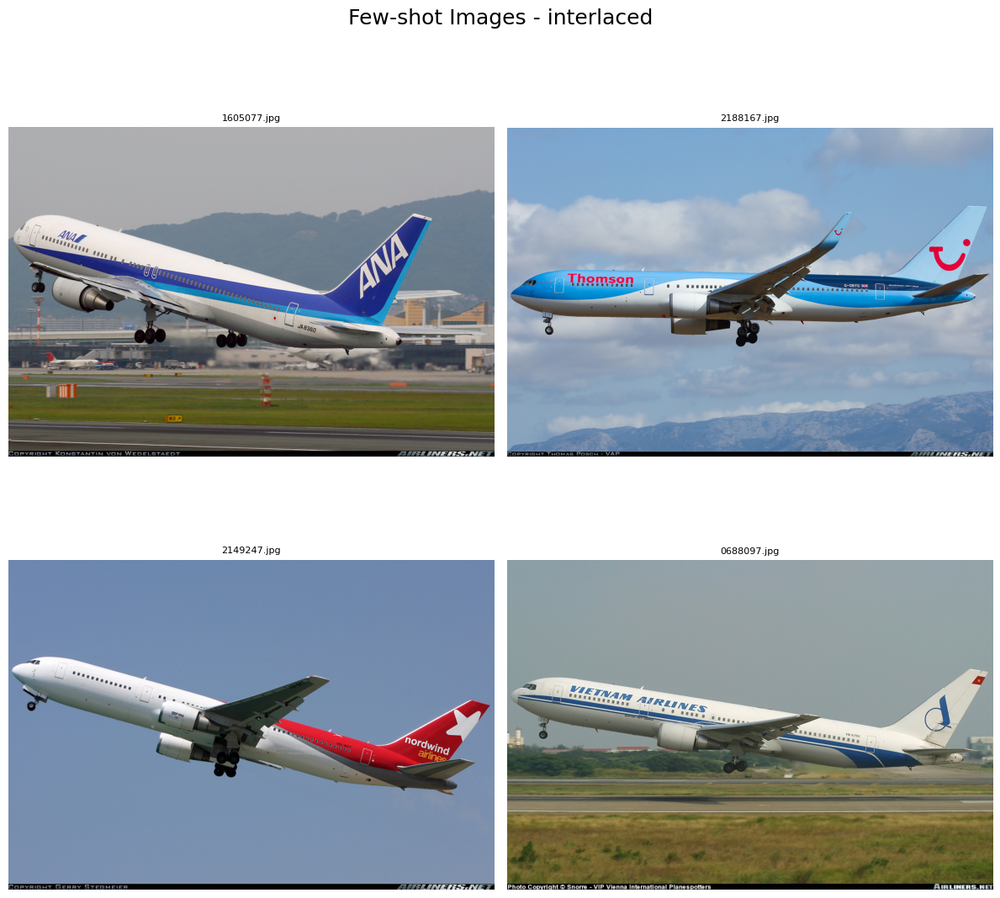

In [118]:
import matplotlib.pyplot as plt
from PIL import Image

# ===== visualize =====
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()
for idx, path in enumerate(fewshot_dict['767-300'][:4]):
    img = Image.open(path).convert("RGB")
    axes[idx].imshow(img)
    # chỉ hiện tên file
    file_name = str(path).split("/")[-1]
    axes[idx].set_title(file_name, fontsize=8)
    axes[idx].axis("off")
plt.suptitle("Few-shot Images - interlaced", fontsize=18)
plt.tight_layout()
plt.show()

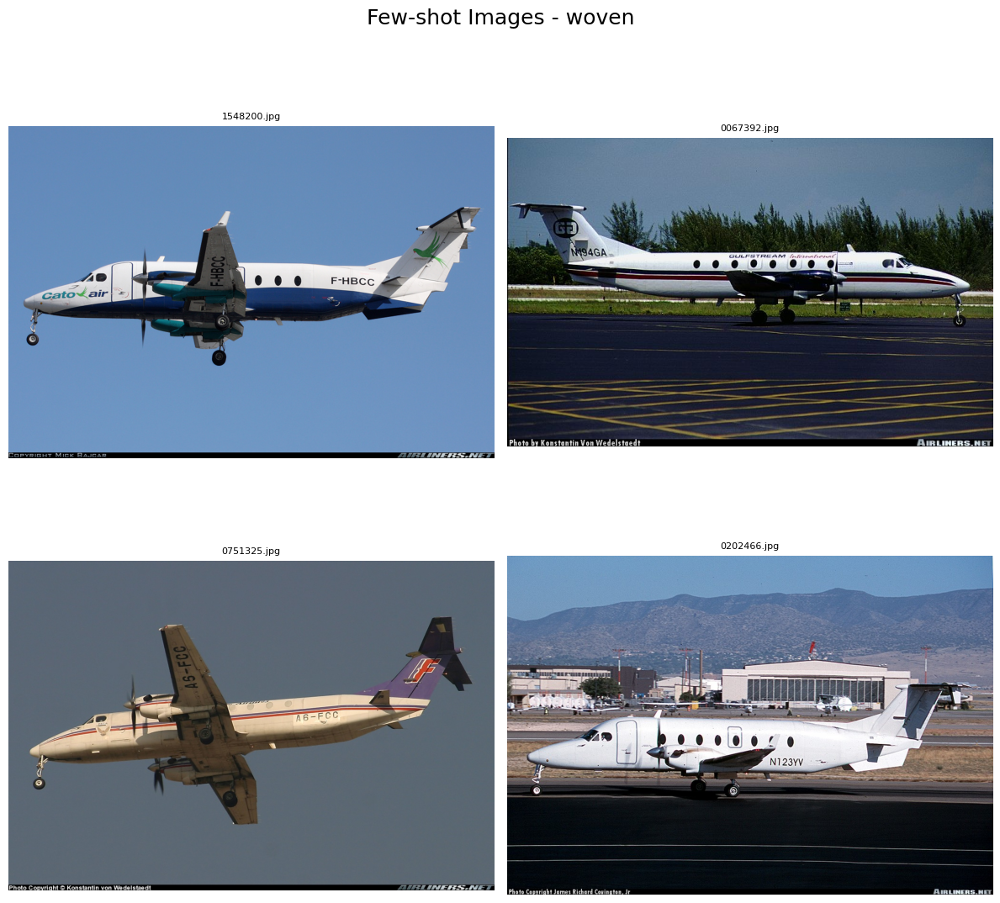

In [122]:
import matplotlib.pyplot as plt
from PIL import Image

# ===== visualize =====
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()
for idx, path in enumerate(fewshot_dict[ 'Beechcraft 1900'][:4]):
    img = Image.open(path).convert("RGB")
    axes[idx].imshow(img)
    # chỉ hiện tên file
    file_name = str(path).split("/")[-1]
    axes[idx].set_title(file_name, fontsize=8)
    axes[idx].axis("off")
plt.suptitle("Few-shot Images - woven", fontsize=18)
plt.tight_layout()
plt.show()

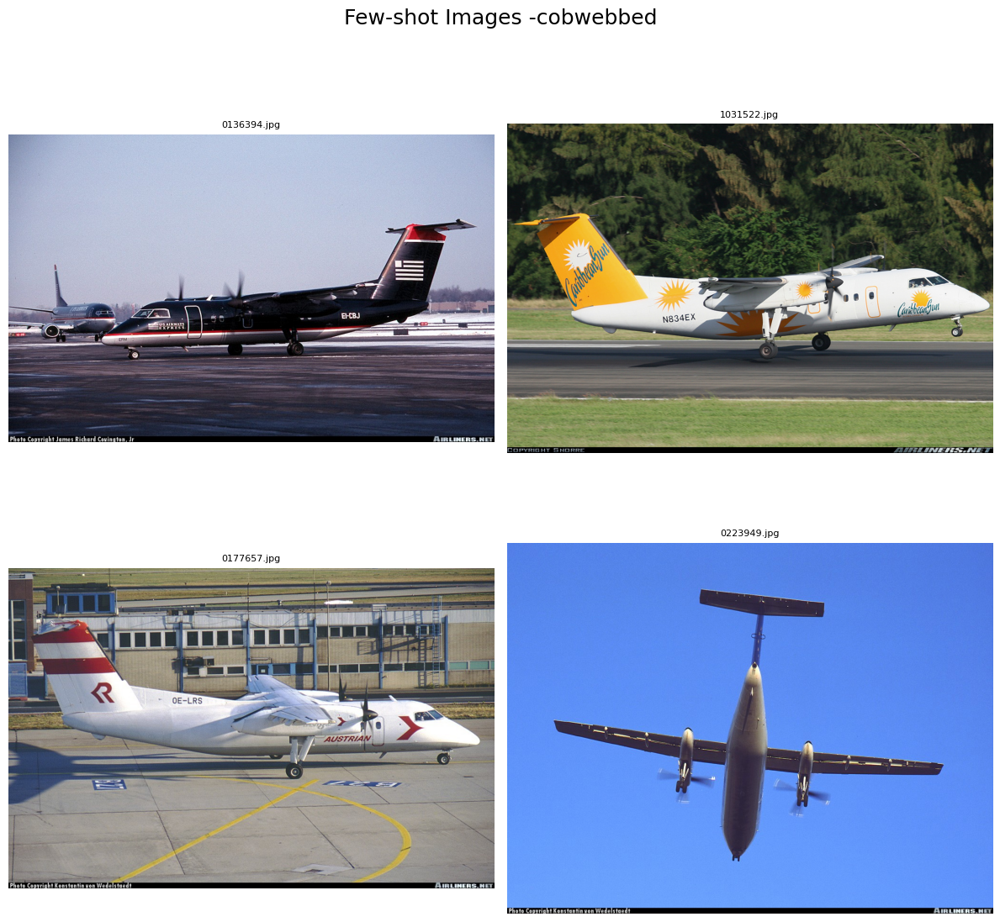

In [123]:
import matplotlib.pyplot as plt
from PIL import Image

# ===== visualize =====
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()
for idx, path in enumerate(fewshot_dict['DHC-8-100'][:4]):
    img = Image.open(path).convert("RGB")
    axes[idx].imshow(img)
    # chỉ hiện tên file
    file_name = str(path).split("/")[-1]
    axes[idx].set_title(file_name, fontsize=8)
    axes[idx].axis("off")
plt.suptitle("Few-shot Images -cobwebbed", fontsize=18)
plt.tight_layout()
plt.show()

In [98]:
def LDA_pair_refinement_instruction(
    class_a_name,
    class_b_name,
    class_a_prompts,
    class_b_prompts
):

    class_a_block = "\n".join(
        f"{i}. {p}" for i, p in enumerate(class_a_prompts, 1)
    )

    class_b_block = "\n".join(
        f"{i}. {p}" for i, p in enumerate(class_b_prompts, 1)
    )

    text = f"""
You are refining prompts for a vision-language model.

You will be given few-shot images and current prompts for two visually confusing classes.

CLASS A: {class_a_name}

Current prompts:
{class_a_block}

CLASS B: {class_b_name}

Current prompts:
{class_b_block}

Task: Rewrite the prompts so that:
- The two classes are more semantically separated (reduce overlap and ambiguity).
- Each class remains diverse, capturing multiple visual modes from the few-shot images.
- Prompts are grounded in visual evidence and reflect distinctive attributes of each class.
- Avoid generic or shared descriptions that could apply to both classes.
- If an attribute appears in both classes, refine it to emphasize subtle discriminative differences.

Output exactly 30 refined prompts per class in English.
Use the class names exactly as provided.
Do not expand, rename, abbreviate, or modify any class name.
Format:

Class: {class_a_name}

1. ...
2. ...
   ...
3. ...

Class: {class_b_name}

1. ...
2. ...
   ...
3. ...

"""

    return text

In [125]:
torch.cuda.empty_cache()

In [95]:
def refine_prompts_by_lda_pair(
    class_names,
    pre_prompts,
    class_a_idx,
    class_b_idx,
    class_a_images,   # list[PIL.Image]
    class_b_images,   # list[PIL.Image]
    max_new_tokens=2048,
):

    instruction_prompt = LDA_pair_refinement_instruction(
        class_a_name=class_names[class_a_idx],
        class_b_name=class_names[class_b_idx],
        class_a_prompts=pre_prompts[class_a_idx],
        class_b_prompts=pre_prompts[class_b_idx]
    )

    # --------------------------------------------------
    # build multimodal content
    # --------------------------------------------------

    content = []

    content.append(
        {
            "type": "text",
            "text": instruction_prompt
        }
    )

    # few-shot images of class A

    content.append(
        {
            "type": "text",
            "text": f"Images of class: {class_names[class_a_idx]}"
        }
    )

    for img in class_a_images:
        content.append(
            {
                "type": "image",
                "image": img
            }
        )

    # few-shot images of class B

    content.append(
        {
            "type": "text",
            "text": f"Images of class: {class_names[class_b_idx]}"
        }
    )

    for img in class_b_images:
        content.append(
            {
                "type": "image",
                "image": img
            }
        )

    messages = [
        {
            "role": "user",
            "content": content
        }
    ]

    # --------------------------------------------------
    # apply template
    # --------------------------------------------------

    text = processor.apply_chat_template(
        messages,
        tokenize=False,
        add_generation_prompt=True,
    )
    # --------------------------------------------------
    # collect images
    # --------------------------------------------------

    images = class_a_images + class_b_images
    inputs = processor(
        text=[text],
        images=images,
        padding=True,
        return_tensors="pt",
    ).to(model_prompts.device)

    # --------------------------------------------------
    # generation
    # --------------------------------------------------
    generated_ids = model_prompts.generate(
        **inputs,
        max_new_tokens=max_new_tokens,
        do_sample=True,
        temperature=0.8,
        top_p=0.95,
        repetition_penalty=1.15,
    )

    generated_ids_trimmed = [
        out_ids[len(in_ids):]
        for in_ids, out_ids in zip(
            inputs.input_ids,
            generated_ids
        )
    ]

    generated_text = processor.batch_decode(
        generated_ids_trimmed,
        skip_special_tokens=True,
        clean_up_tokenization_spaces=True,
    )[0]

    return generated_text

In [17]:
torch.cuda.empty_cache()

In [96]:
import re

def parse_class_prompts(text):
    results = {}

    header_pattern = re.compile(
        r"(?:\*\*)?(?:Refined Prompts for )?Class:\s*([^\n*]+)(?:\*\*)?",
        re.I
    )

    headers = list(header_pattern.finditer(text))

    for i, h in enumerate(headers):
        class_name = h.group(1).strip().lower()

        start = h.end()
        end = headers[i + 1].start() if i + 1 < len(headers) else len(text)

        block = text[start:end]

        prompts = []
        for m in re.finditer(r"^\d+\.\s*(.+)$", block, re.M):
            prompts.append(m.group(1).strip())

        results[class_name] = prompts

    return results

In [19]:
import torch
import torch.nn.functional as F


@torch.no_grad()
def filter_pairwise_prompts(
    model,
    prompts_A,
    prompts_B,
    num_keep=20,
    device="cuda",
):
    """
    score_A = cos(z_A, mu_A) - cos(z_A, mu_B)
    score_B = cos(z_B, mu_B) - cos(z_B, mu_A)

    Keep exactly num_keep prompts for each class.
    """

    # --------------------------------------------------
    # Encode
    # --------------------------------------------------
    zA = model.process(
        [{"text": p} for p in prompts_A]
    ).to(device)

    zB = model.process(
        [{"text": p} for p in prompts_B]
    ).to(device)

    zA = F.normalize(zA, dim=-1)
    zB = F.normalize(zB, dim=-1)

    # --------------------------------------------------
    # Class centers
    # --------------------------------------------------
    mu_A = F.normalize(
        zA.mean(dim=0, keepdim=True),
        dim=-1,
    )

    mu_B = F.normalize(
        zB.mean(dim=0, keepdim=True),
        dim=-1,
    )

    # --------------------------------------------------
    # Pairwise discriminative scores
    # --------------------------------------------------
    score_A = (
        F.cosine_similarity(zA, mu_A, dim=-1)
        - F.cosine_similarity(zA, mu_B, dim=-1)
    )

    score_B = (
        F.cosine_similarity(zB, mu_B, dim=-1)
        - F.cosine_similarity(zB, mu_A, dim=-1)
    )

    # --------------------------------------------------
    # Top-k
    # --------------------------------------------------
    kA = min(num_keep, len(prompts_A))
    kB = min(num_keep, len(prompts_B))

    idxA = torch.topk(score_A, kA).indices.cpu().tolist()
    idxB = torch.topk(score_B, kB).indices.cpu().tolist()

    kept_A = [prompts_A[i] for i in idxA]
    kept_B = [prompts_B[i] for i in idxB]

    return kept_A, kept_B

In [29]:
!pip install munch

In [78]:
fewshot_dict.keys()

dict_keys(['707-320', '727-200', '737-200', '737-300', '737-400', '737-500', '737-600', '737-700', '737-800', '737-900', '747-100', '747-200', '747-300', '747-400', '757-200', '757-300', '767-200', '767-300', '767-400', '777-200', '777-300', 'A300B4', 'A310', 'A318', 'A319', 'A320', 'A321', 'A330-200', 'A330-300', 'A340-200', 'A340-300', 'A340-500', 'A340-600', 'A380', 'ATR-42', 'ATR-72', 'An-12', 'BAE 146-200', 'BAE 146-300', 'BAE-125', 'Beechcraft 1900', 'Boeing 717', 'C-130', 'C-47', 'CRJ-200', 'CRJ-700', 'CRJ-900', 'Cessna 172', 'Cessna 208', 'Cessna 525', 'Cessna 560', 'Challenger 600', 'DC-10', 'DC-3', 'DC-6', 'DC-8', 'DC-9-30', 'DH-82', 'DHC-1', 'DHC-6', 'DHC-8-100', 'DHC-8-300', 'DR-400', 'Dornier 328', 'E-170', 'E-190', 'E-195', 'EMB-120', 'ERJ 135', 'ERJ 145', 'Embraer Legacy 600', 'Eurofighter Typhoon', 'F-16A/B', 'F/A-18', 'Falcon 2000', 'Falcon 900', 'Fokker 100', 'Fokker 50', 'Fokker 70', 'Global Express', 'Gulfstream IV', 'Gulfstream V', 'Hawk T1', 'Il-76', 'L-1011', 'MD

In [100]:
def match_class_name(target_class, parsed_dict):

    target = normalize_class_name(target_class)

    # Exact match
    for key in parsed_dict:
        if normalize_class_name(key) == target:
            return key

    # Substring match
    candidates = []

    for key in parsed_dict:

        norm_key = normalize_class_name(key)

        if target in norm_key or norm_key in target:
            candidates.append(key)

    # Chỉ nhận nếu có đúng 1 candidate
    if len(candidates) == 1:
        return candidates[0]

    return None

In [102]:
import re


def normalize_class_name(name):
    name = str(name).lower().strip()

    # Chuẩn hóa khoảng trắng
    name = re.sub(r"\s+", " ", name)

    # Loại bỏ một số ký tự phân cách
    name = name.strip(": ")

    return name

In [103]:
def find_class_key(target_class, parsed_dict):

    target = normalize_class_name(target_class)

    # 1. Exact match
    if target in parsed_dict:
        return target

    # 2. Kiểm tra target nằm trong parsed key
    for key in parsed_dict.keys():

        norm_key = normalize_class_name(key)

        if target in norm_key:
            return key

    # 3. Kiểm tra parsed key nằm trong target
    for key in parsed_dict.keys():

        norm_key = normalize_class_name(key)

        if norm_key in target:
            return key

    return None

In [104]:
k_images = 4
best_prompts = loaded_list.copy()
n_runs = 5
LDA_loss_arr = []
tr_SB_arr = []
tr_SW_arr = []


dataset = "fgvc_aircraft"
classes = SUBSET_NAMES[dataset]
for run in tqdm(range(n_runs)):
  print('-'*50)
  print(f"Run Time: {run}")
  print('-'*50)
  # Find hard pairs
  hard_pairs = find_topk_hard_lda_pairs(
    model,
    prompts_by_class = best_prompts,
    k=10,
    device=device
)
  refined_prompts = {key: [] for key in classes}
  for p in tqdm(hard_pairs[:10]):
    print(
        f"({p['class_i']}, {p['class_j']}) "
        f"loss={p['lda_loss']:.4f} "
        f"ratio={p['ratio']:.4f}"
    )

    image_paths_class_a = sample_images(
            fewshot_dict=fewshot_dict,
            class_name= classes[p['class_i']],
            k=k_images
        )

    pil_images_a = load_pil_images(image_paths_class_a)
    image_paths_class_b = sample_images(
            fewshot_dict=fewshot_dict,
            class_name= classes[p['class_j']],
            k=k_images
        )
    pil_images_b = load_pil_images(image_paths_class_b)

    generated = refine_prompts_by_lda_pair(
    class_names = classes,
    pre_prompts = best_prompts,
    class_a_idx = p['class_i'],
    class_b_idx = p['class_j'],
    class_a_images = pil_images_a,   # list[PIL.Image]
    class_b_images = pil_images_b,   # list[PIL.Image]
    )

    parse = parse_class_prompts(generated)
    for cls_name, prompts in parse.items():
        print(f"Class: {cls_name}")
        print(f"Number of prompts: {len(prompts)}")
        print(prompts[:5])
    print('-'*20)
    class_i = classes[p['class_i']]
    class_j = classes[p['class_j']]

    key_i = match_class_name(class_i, parse)
    key_j = match_class_name(class_j, parse)

    if key_i is not None:
      refined_prompts[class_i] = parse[key_i]
    else:
      print(f"\nWarning: Cannot match '{class_i}'")
      print("Parsed keys:", list(parse.keys()))

    if key_j is not None:
      refined_prompts[class_j] = parse[key_j]
    else:
      print(f"\nWarning: Cannot match '{class_j}'")
      print("Parsed keys:", list(parse.keys()))
    # Lọc best prompts
    kept_A, kept_B = filter_pairwise_prompts(model,
                                         best_prompts[p['class_i']] + refined_prompts[classes[p['class_i']]],
                                         best_prompts[p['class_j']] + refined_prompts[classes[p['class_j']]],
                                         num_keep=30,
                                         device="cuda")
    best_prompts[p['class_i']] = kept_A
    best_prompts[p['class_j']] = kept_B

  #Compute lda
  loss_refined, tr_SB_refined, tr_SW_refined = compute_balanced_lda_loss(best_prompts)
  print(f"LDA loss: {loss_refined.item()}, tr(SB): {tr_SB_refined.item()}, tr(SW): {tr_SW_refined.item()}")
  LDA_loss_arr.append(loss_refined.item())
  tr_SB_arr.append(tr_SB_refined.item())
  tr_SW_arr.append(tr_SW_refined.item())

  0%|          | 0/5 [00:00<?, ?it/s]

--------------------------------------------------
Run Time: 0
--------------------------------------------------



  0%|          | 0/10 [00:00<?, ?it/s]

(17, 18) loss=3.1875 ratio=0.0410
Class: 767-300
Number of prompts: 20
['Offers an extended fuselage compared to the 767-200, with a longer cabin space accommodating more seats.', 'Distinguished by a sleeker, more aerodynamic fuselage, fewer windows along its length, and smaller engines underwing.', 'Exhibits a slimmed-down design without winglets; instead, the 767-300 boasts a T-tail and cleaner lines.', 'Has a more restrained appearance with fewer side-mounted windows and a shorter tail fin.', 'Features an elongated fuselage marked by a smooth, almost streamlined profile.']
Class: 767-400
Number of prompts: 30
['Offers significantly greater range and seating capacity compared to earlier versions, evident from its longer fuselage extension.', 'Notable for its substantially increased fuselage length and expanded wingspans, ensuring room for more passengers.', 'Features an elongated fuselage and more expansive wing design, delivering enhanced passenger carrying ability alongside heighte


 10%|█         | 1/10 [00:59<08:54, 59.37s/it]

(3, 4) loss=2.8906 ratio=0.0554
Class: 737-300
Number of prompts: 30
['More windows across the fuselage compared to other variants within the same series.', 'Wing curvature slightly elevated near the engine pylon.', 'Tail fin exhibits a T-shaped structure, distinct among variations.', 'Engine nacelle positions reveal a classic podded installation beneath the wing.', 'Cockpit doors located mid-section of the fuselage, differing noticeably from others.']
Class: 737-400
Number of prompts: 30
['Tail has a triangular design, distinguishably unique against competitors.', 'Engine pods are situated low under the wing, creating a uniform look.', 'Longer fuselage stretching further backward, showcasing passenger growth potential.', 'Rear exit door placement distinguishes it from other models.', 'Higher cabin ceiling contributes to broader passenger comfort.']
--------------------



 20%|██        | 2/10 [01:40<06:27, 48.48s/it]

(40, 60) loss=2.8281 ratio=0.0593



 30%|███       | 3/10 [02:02<04:14, 36.41s/it]

Class: beechcraft 1900
Number of prompts: 15
['Compact, twin-engine propeller aircraft with a high-wing configuration, featuring straight wings and a T-tail.', 'Boxy fuselage with a rounded nose, small circular windows, and clean lines.', 'Single engine located beneath the wings, with a visible propeller.', 'Tail features a distinctive T-shaped vertical stabilizer.', 'Smooth, sleek body typical of turboprops, with swept-back wings.']
Class: dhc-8-100
Number of prompts: 11
['Twin-engine, low-wing aircraft with a dark body and lighter underside, indicating efficient heat dissipation.', 'Elliptically shaped windows distributed evenly across body length for panoramic views; notable in aerial photography captures.', 'Short fuselage with a wide range of windows along its perimeter, aiding ground navigation accuracy.', "Frontal profile reveals sharply angled nose cone and prominent 'hump' where engines sit just aft.", 'Compact boxy shape with no apparent sharp corners, hinting towards ergonom


 40%|████      | 4/10 [02:34<03:27, 34.62s/it]

Class: a318
Number of prompts: 14
['The A318 sports a sleek and compact silhouette with a streamlined fuselage and a pointed nose, ideal for short-haul flights.', 'Noticeably thinner wings and engine nacelles than those found on the A319, emphasizing its efficiency in tight spaces like regional runways.', 'Compact size paired with narrow fuselage highlights this aircraft’s agility over long distances without compromising speed.', 'Slim profile and reduced cabin width set the A318 apart distinctly when compared directly against its larger sibling - the A319.', 'Low-mounted wings paired with a T-tail make up the main identifying feature, further accentuating its lightweight yet durable construction.']
Class: a319
Number of prompts: 12
["Distinguished immediately by its longer fuselage extending beyond where the A318's would stop; this extends cabin space considerably for passenger comfort.", 'Large jet bridge connection signifies the ability to accommodate more people efficiently; great 


 50%|█████     | 5/10 [02:55<02:28, 29.70s/it]

Class: embraer legacy 600
Number of prompts: 8
['Sleek body with a smooth nose cone, indicative of a modern and efficient look; note the T-tail structure for better visibility.', 'Winglet-equipped swept-back wings add an extra touch of aerodynamic perfection suitable for high-performance flying.', 'Cleanly finished fuselage with round portholes arranged linearly along its length, highlighting comfort inside while ensuring optimal airflow outside.', 'Narrow fuselage provides ample space for passengers without compromising the sleek lines of the plane.', 'Painted in neutral shades like white or beige, allowing for striking airline livery applications.']
Class: gulfstream iv
Number of prompts: 8
['Rounded nose and vertical stabilizers provide enhanced directional stability upon ascent and descent phases of flight; four powerful engines ensure maximum power output necessary throughout entire duration.', 'Sharp angles and integrated components make this luxurious private jet stand out amids


 60%|██████    | 6/10 [03:27<02:02, 30.71s/it]

Class: 777-300
Number of prompts: 9
['A wide-bodied jet airliner with a sleek fuselage, long wings spanning the sky, and T-tail design. Distinctive cockpit windows set against a narrow nose.', 'Aircraft with a high-mounted horizontal stabilizer and sweeping rear wing sections, featuring four engines beneath wings and a long fuselage.', 'Jumbo airplane displaying a polished, aerodynamic profile with a sharp nose tip, long body, and tri-hinged flaps extending over the rear.', 'Massive multi-passenger jet with stretched fuselage, four engines under swept wings, and humped cockpit region.', 'Airplane boasting a long fuselage, slim wings, and sleek, rounded nose, with T-tail configuration clearly visible at the rear end.']
Class: a340-300
Number of prompts: 19
['Wider fuselage with high-wings configuration supporting four engines below, and T-tailed structure atop vertical stabilizer.', 'A340-300 showcasing a large, rectangular body and straight wings, accentuated by a robust T-tail and sli


 70%|███████   | 7/10 [03:45<01:18, 26.30s/it]

Class: e-170
Number of prompts: 10
['Mid-sized regional jet with a sleek design, featuring prominent swept wings and a glass cockpit with a polished finish.', 'Low-nostril intake system contributing to its aerodynamic shape.', 'Characteristic T-tail with a high position relative to the fuselage.', 'Engine placement at the rear provides symmetry to its fuselage contour.', 'Distinguished by its streamlined body and emphasis on aerodynamics.']
Class: erj 135
Number of prompts: 10
['Small to medium-sized twin-engine jet with a streamlined fuselage and a T-tail configuration.', 'Well-defined rounded nose section with pronounced front windshield area.', 'Straight wing design emphasizing simplicity and functionality over swept geometry.', 'Clean, uncluttered cockpit design suggesting advanced avionic capabilities within confined space constraints.', 'Tailplane positioned behind the main plane for improved trim control; horizontal stabilizer integrated into empennage.']
--------------------
(7


 80%|████████  | 8/10 [04:20<00:58, 29.36s/it]

Class: fokker 100
Number of prompts: 14
['Long, sleek fuselage with a pointed nose and a pronounced T-tail, providing exceptional ground handling and maneuverability.', 'High-mounted wings with a moderate span, complemented by short and sturdy struts, enhancing structural integrity.', 'Four engine pods located underneath the wings ensure balanced weight distribution and optimal propulsion alignment.', 'Slender, vertical stabilizer with red and teal markings, indicative of regional airline branding, aiding in pilot visibility and approach guidance.', 'Airplane displaying its characteristic T-tail and high wing configuration while taxiing onto runway, ready for departure.']
Class: fokker 70
Number of prompts: 12
['Compact fuselage with tapered ends, enabling superior agility in tight spaces like busy city centers where many short haul flights originate/terminate.', 'Slotted wings design optimizing airflow around engine nacelles thereby minimizing turbulence encountered during climb phase


 90%|█████████ | 9/10 [04:45<00:27, 27.75s/it]

Class: 737-500
Number of prompts: 12
['Long fuselage with large engine intakes near wing roots; designed for mid-range flights.', 'Pronounced swept wings; typical T-tail design; seating capacity exceeding earlier models.', 'Higher wingline; wider fuselage; smoother cockpit area; optimized for fuel-efficient cruising.', 'Visible horizontal stabilizers; single aisle cabin configuration suited for short-medium distances.', 'Sharp leading edge extensions on wings; notice the forward-looking angle of the nose structure.']
Class: 737-600
Number of prompts: 12
['Slender fuselage design emphasizing passenger density rather than size; smaller engines indicative of efficiency.', 'Subtle difference in wing shape; characteristic T-tail; tailored for cost-effective regional travel.', 'Overall shorter length when compared against fellow 737 family members; single-aisle structure built tough.', 'Optimized vertical stabilizer; simpler exterior details; perfect match for short haul operations.', 'Wing 


100%|██████████| 10/10 [05:17<00:00, 31.72s/it]

Class: a340-500
Number of prompts: 6
['The A340-500 is identifiable by its elongated fuselage, stretching far beyond what’s seen on earlier versions like the A340-300. Its T-tail ensures pitch stability throughout varied flight conditions. Visible engines are positioned close to the wing roots, promoting efficient airflow.', 'With its stretched fuselage, this A340-500 accommodates a larger passenger cabin inside, suggesting it’s tailored towards extensive long-haul journeys rather than short regional ones.', 'Compared to prior models, the A340-500 shows a noticeable increase in the fuselage’s overall length, with an extended tail also contributing towards adding range and carrying capacity.', "As one of Airbus' iconic widebody planes, the A340-500 stands out through its unique T-tail design combined with four-underwing-mounted engines—essential characteristics distinguishing itself from its predecessor, the A340-300.", 'The A340-500 offers significant improvements in its aerodynamics t


 20%|██        | 1/5 [05:30<22:03, 330.98s/it]

LDA loss: 1.390625, tr(SB): 0.09228515625, tr(SW): 0.37109375
--------------------------------------------------
Run Time: 1
--------------------------------------------------



  0%|          | 0/10 [00:00<?, ?it/s]

(50, 90) loss=2.5625 ratio=0.0767



 10%|█         | 1/10 [00:20<03:06, 20.69s/it]

Class: cessna 560
Number of prompts: 10
['Sleek, mid-sized twin-engine jet with a high-wing configuration and large rear-mounted engines, emphasizing speed and payload capability.', 'Compact fuselage with five round windows along the side and a long, narrow nose housing the cockpit.', 'Aerodynamically optimized design with a distinctive T-tail feature enhancing visibility during ground maneuvers.', 'Low-profile landing gear arrangement, including a tricycle type near the main cabin door.', 'Narrow fuselage tapered toward the tail end and equipped with swept-back wings extending beyond the wingtips.']
Class: model b200
Number of prompts: 10
['Compact and sleek design focused primarily on aerodynamic efficiency rather than size, reflecting a minimalist approach to passenger comfort.', 'Utilitarian interior catering specifically to practical needs over luxury considerations due to the nature of regional travel services offered.', 'Aerodynamically integrated wings swept back slightly but s


 20%|██        | 2/10 [00:43<02:56, 22.07s/it]

Class: falcon 2000
Number of prompts: 10
['Sleek, narrow fuselage with large, circular windows, offering a premium passenger experience.', 'T-tail configuration with a slim, angled horizontal stabilizer atop the vertical fin.', 'Single-engine design prominently located within the nose section for optimal aerodynamics.', 'Clean lines highlight its business jet origins with a luxurious cabin and comfortable seating arrangements.', 'Fuselage design emphasizes efficiency through a slightly tapered shape and a well-integrated tailplane structure.']
Class: saab 2000
Number of prompts: 10
['Broad fuselage with expansive cabin suitable for medium-haul routes; notably longer than Falcon counterparts.', 'Distinguished by conical nose containing advanced radar for better navigational accuracy and situational awareness.', 'Characterized by T-tail assembly providing ample space beneath wing for auxiliary equipment such as cargo storage containers or additional fuel tanks when configured accordingly


 30%|███       | 3/10 [01:12<02:56, 25.19s/it]

Class: 737-500
Number of prompts: 11
['Noticeably larger engine intakes located closer to the wing roots indicate significant power output.', 'Observe the sharp leading-edge extensions on the wings emphasizing their aerodynamic optimization.', 'Its slightly arched nose gives off a more balanced and streamlined impression.', 'The pronounced wing sweep adds a touch of modernity while improving fuel efficiency.', "Unique cockpit windows set apart this variant's identity."]
Class: 737-700
Number of prompts: 28
['The 737-700 boasts notably longer fuselage length suitable for slightly longer ranges.', 'Slenderer wings with minimal upward curve aid in achieving higher speed performance.', 'Examine the stretched fuselage design providing increased passenger capacity.', 'Compare the taller windshield view indicative of a larger cabin layout.', 'Longer wingspans signify superior fuel efficiency and operational flexibility.']
--------------------
(14, 16) loss=2.5000 ratio=0.0815



 40%|████      | 4/10 [01:40<02:37, 26.21s/it]

Class: 757-200
Number of prompts: 11
['Features a more elongated fuselage compared to the 767-200, with clearly visible side-by-side engine placement beneath the wings.', 'Possesses a gently curved nose and a notably smaller cockpit area relative to wider-bodied aircraft such as the 767.', 'Displays a compact overall layout emphasizing agility over sheer volume.', 'Shows a higher aspect ratio wing design with thinner profiles typical of regional jets rather than long-haul aircraft designs.', 'Emphasizes its role in short-to-medium haul markets through its specific T-tail and swept-back wing configurations.']
Class: 767-200
Number of prompts: 12
['Distinctly characterized by its broader fuselage, indicative of its suitability for longer-range flights and accommodating larger numbers of passengers.', 'Equipped with prominent wing-mounted engines further back under the wings than typically found on narrower planes like the 757-200.', 'Reveals a more spacious interior capable of supporting


 50%|█████     | 5/10 [02:03<02:05, 25.16s/it]

Class: 737-800
Number of prompts: 10
['Increased fuselage length compared to earlier models; distinctively stretched fuselage with larger wings and tail surfaces.', 'Displays a smooth, aerodynamic profile typical of its generation – notable expansion from predecessor models.', 'Designed primarily for medium-length routes yet can serve some long-haul missions due to its efficiency.', 'Distinguished by prominent T-shaped tail design visible when parked or airborne.', 'Engine placement under wing adds to aerodynamic performance while accommodating extended cabin space.']
Class: 737-900
Number of prompts: 10
['Longer fuselage distinguishes it clearly against smaller variations - notably stretching out horizontally to support more passengers comfortably.', 'Tail section shows minimal curves signifying optimization for higher speeds without excessive drag influence felt throughout cruising phase.', 'Clearly marked as one end of the spectrum amongst 737 range series; signifies substantial lea


 60%|██████    | 6/10 [03:27<03:00, 45.08s/it]

(11, 12) loss=2.4531 ratio=0.0854



 70%|███████   | 7/10 [03:49<01:52, 37.59s/it]

Class: 747-200
Number of prompts: 14
['Characterized by its classic T-tail configuration and rounded nose shape.', 'Distinctively different from earlier 747s with a slimmed-down fuselage.', 'Long fuselage with a slight upward-curved nose provides a streamlined look.', 'Engines placed low beneath the wings create balanced proportions.', 'Visible main landing gear undercarriage near the front enhances visibility.']
Class: 747-300
Number of prompts: 15
['Recognizable by its markedly longer fuselage, extending well beyond -200 variant.', 'Pronounced hump above cockpit clearly indicates increased passenger capacity.', 'Unique T-tail design set apart from standard -200 configurations.', 'Wide fuselage allows for more passengers or freight storage.', 'Larger engine intakes signify enhanced thrust output for better range capability.']
--------------------
(63, 94) loss=2.4062 ratio=0.0898



 80%|████████  | 8/10 [04:09<01:03, 31.96s/it]

Class: dornier 328
Number of prompts: 14
['High-wing regional aircraft with T-tail configuration.', 'Clean, angular design emphasizing efficiency; elongated fuselage for capacity.', 'Turboprop engine placement ensures a robust yet streamlined look.', 'Distinctive swept-back wing and round nose create a modern aesthetic.', 'Two turboprops under the wings offer balanced power distribution.']
Class: saab 340
Number of prompts: 14
['Short-haul regional jet features a T-tail design.', 'High-wing layout maximizes interior space efficiently.', 'Clear distinction between front and rear sections with a robust nose.', 'Four propellers provide enhanced propulsion capabilities.', 'Smooth, well-maintained body reflects operational durability.']
--------------------
(22, 25) loss=2.3750 ratio=0.0933



 90%|█████████ | 9/10 [04:47<00:33, 33.71s/it]

Class: a310
Number of prompts: 7
['The A310 features a sleek, slim fuselage that extends far beyond the wings, creating a striking contrast against its smaller cockpit area—a hallmark of its design meant to maximize passenger capacity without compromising agility.', 'With a distinctive flat-bottom design, this aircraft offers ample room inside despite being mid-sized; noticeable in the way passengers can stretch out comfortably during flight.', 'Set apart by its unusually slender fuselage and tall vertical stabilizer atop a uniquely shaped horizontal stabilizer, the A310’s T-tail stands out, complementing its overall minimalist aesthetic.', 'The dual exhausts integrated into the under-wing engine pods of the A310 are key identifying features—cleanly tucked away yet visible enough to differentiate it from contemporaries like the A330.', 'Notably, there isn’t the same emphasis on a protruding upper deck seen in many A310 versions – its main compartment occupies much lower-down space, emp


 40%|████      | 2/5 [11:54<18:06, 362.15s/it]

LDA loss: 1.359375, tr(SB): 0.0966796875, tr(SW): 0.375
--------------------------------------------------
Run Time: 2
--------------------------------------------------



  0%|          | 0/10 [00:00<?, ?it/s]

(71, 72) loss=2.3594 ratio=0.0938



 10%|█         | 1/10 [00:22<03:26, 22.99s/it]

Class: eurofighter typhoon
Number of prompts: 15
['Distinctive delta wing design paired with twin vertical stabilizers for superior maneuverability and agility.', 'Angular cockpit canopy and symmetrical canards contributing to its dynamic profile.', 'Twin-engined setup with large afterburners indicating high-performance capabilities.', 'Low observable features including blended paneling and composite materials to reduce radar detection.', 'Compact and streamlined body design focusing on speed and agility.']
Class: f-16a/b
Number of prompts: 12
['Compact and lightweight construction enabling swift acceleration and rapid climb rates.', 'Single-seater design prioritizing simplicity but maximizing pilot focus during flight operations.', 'Twin tail fins with low-intensity color markings signifying minimalist approach to identification.', 'Angular bubble canopy optimizing visibility towards horizon, essential for close combat situations.', 'Slim and rectangular wings optimized for maximum li


 20%|██        | 2/10 [01:06<04:41, 35.20s/it]

(51, 93) loss=2.3281 ratio=0.0977
Class: challenger 600
Number of prompts: 20
['Sleek, twin-engine business jet with a long, low-profile fuselage and T-tail configuration.', 'Modern jet with a prominent T-tail and large windowpanes for excellent visibility.', 'Compact yet elegant aircraft with a distinctive T-tail and slim fuselage.', 'Advanced business jet with twin engines, featuring a smooth, streamlined body.', 'High-wing configuration ensures minimal wing wake turbulence and enhanced cockpit views.']
Class: saab 2000
Number of prompts: 27
['Turboprop-powered regional jet with dual engines under the wings.', 'Large twin-engine airliner designed for extensive range and flexibility.', 'Twin-turboprop airplane with a unique bubble-like cockpit for advanced navigation.', 'Mid-sized twin-engine regional airliner sporting a narrow body.', 'Compact jet with dual engines and a robust, utilitarian design.']
--------------------



 30%|███       | 3/10 [01:44<04:13, 36.24s/it]

(50, 64) loss=2.3125 ratio=0.0991



 40%|████      | 4/10 [02:21<03:39, 36.55s/it]

Class: cessna 560
Number of prompts: 30
['Compact twin-engine jet with a sleek, mid-sized fuselage and high-wing configuration.', 'Distinctive T-tail and swept-back wings create a compact form factor.', 'Long fuselage with narrow cabin emphasizes passenger capacity.', 'Rear-mounted engines integrated into the wings provide balanced layout.', 'Sleek, aerodynamic profile suggests a focus on performance.']
Class: e-170
Number of prompts: 30
['Mid-sized twin-engine jet with a distinct T-tail and swept wings.', 'Streamlined body and emphasis on aerodynamics are evident.', 'Slim fuselage and extensive glazing signify modern aviation trends.', 'Swept-back wings and long fuselage define efficient flight mechanics.', 'Rounded nose with minimal detailing aligns with aerodynamic principles.']
--------------------
(19, 27) loss=2.2969 ratio=0.1011



 50%|█████     | 5/10 [02:59<03:06, 37.28s/it]

Class: 777-200
Number of prompts: 12
['Characterized by its exceptionally long fuselage and double-deck design, distinguishing itself through advanced systems and passenger-carrying capabilities.', 'The 777-200 boasts a sleek, high-wing design with pronounced tail fins, set apart by its expansive passenger cabin layout.', 'Noticeable with its slim yet long fuselage marked by a high T-tail and engine nacelles under the wings, embodying remarkable engineering sophistication.', 'Designed with an emphasis on efficiency, it exhibits a notably taller tail surface and large, sweeping wings for high-speed travel.', 'Highlighted by its imposing size and layered cabin structure, this plane underscores its ability to accommodate numerous passengers comfortably across great distances.']
Class: a330-200
Number of prompts: 17
['Exhibiting a narrow-body fuselage with sleek contours and a gracefully curved rear end, marking its difference among other wide-body planes.', 'With a compact nose section an


 60%|██████    | 6/10 [03:56<02:54, 43.75s/it]

(45, 46) loss=2.2812 ratio=0.1016



 70%|███████   | 7/10 [04:19<01:51, 37.02s/it]

Class: crj-700
Number of prompts: 10
['A medium-sized regional jet with a long fuselage, marked by its T-tail configuration and twin engines under the wings.', 'Recognizable by its slim fuselage, prominent cockpit windows, and swept-back wings for efficient flight.', 'Characterized by a high-wing design and a sleek profile, typical of this regional aircraft category.', 'Distinguished by a more compact shape, fewer windows, and a less pronounced nose cone when compared to other regional jets.', 'Exhibiting a streamlined appearance with a smooth fuselage and vertical stabilizer, indicative of its optimization for performance.']
Class: crj-900
Number of prompts: 10
['A large regional jet distinguished by a long, stretched fuselage extending beyond what is seen in smaller variants such as the CRJ-700.', 'Marked by substantial windows along its side, indicating extra seating for passengers.', 'Characterized by an elongated fuselage, wider wingspans, and a more visible T-tail configuration.'


 80%|████████  | 8/10 [05:03<01:18, 39.29s/it]

(11, 14) loss=2.2500 ratio=0.1055



 90%|█████████ | 9/10 [05:40<00:38, 38.44s/it]

Class: 747-200
Number of prompts: 30
['Smooth, contoured exterior design emphasizes aerodynamics over bulkiness.', 'Classic T-tail configuration and rounded nose shape distinguish this model.', 'Smaller size and lower profile give it a modern, efficient appearance.', 'Main landing gear located at the front enhances visibility.', 'Subtle differences in engine and wingtip shapes set apart from older versions.']
Class: 757-200
Number of prompts: 29
['More compact and streamlined fuselage design sets apart from bigger counterparts.', 'Distinctly smaller vertical stabilizers compare favorably across various angles.', 'Agile stance evident through compactness noted especially during flight phases.', 'Kinked vertical stabilizer offers a sharp visual signature.', 'Swept-back wing and smaller body signify a different build philosophy.']
--------------------
(20, 21) loss=2.1875 ratio=0.1118



100%|██████████| 10/10 [06:29<00:00, 39.00s/it]

Class: 777-300
Number of prompts: 15
['The aircraft displays a sleek, slender fuselage with a rounded nose and swept-back wings. The T-tail configuration stands out, and the engines are mounted on the underside of the wings.', 'The airplane features a long, cylindrical fuselage with a streamlined body and a distinctive T-tail design. The wings are swept back and appear integrated seamlessly into the fuselage.', 'The aircraft showcases a high-mounted horizontal stabilizer and a slender, elongated fuselage. The T-tail arrangement is clearly visible from various angles.', 'The long, thin fuselage with a sharp nosecone suggests high-speed capabilities, complemented by the twin engines mounted under the wings’ leading edge.', 'The wide, sleek fuselage with a prominent hump over the cockpit and four engines under the wings indicates its long-distance capacity.']
Class: a300b4
Number of prompts: 22
['The aircraft exhibits a boxy fuselage with a rounded nose and row upon row of rectangular win


 60%|██████    | 3/5 [18:38<12:42, 381.04s/it]

LDA loss: 1.2890625, tr(SB): 0.103515625, tr(SW): 0.376953125
--------------------------------------------------
Run Time: 3
--------------------------------------------------



  0%|          | 0/10 [00:00<?, ?it/s]

(72, 82) loss=2.2031 ratio=0.1104
Class: f-16a/b
Number of prompts: 14
['**Single-seater design prioritizing simplicity but maximizing pilot focus during flight operations**', '**Distinctive diamond-shaped airframe; high-speed flight; good agility**', '**Low-mounted wings angled back for enhanced stability & control**', '**Vibrant red and white color scheme; multi-surface wing design for agility**', '**Twin vertical stabilizers atop fuselage, unique amongst combat jets**']
Class: hawk t1
Number of prompts: 20
['**Two-engines under wings for broad aerodynamic flexibility,**', '**Sharp angles on wings and tail fins accentuate agility,**', '**Lightweight build optimizes speed and responsiveness,**', '**Fixed tricycle gear enhances stable taxiing, landings,**', '**Delta-wing layout emphasizes high maneuverability,**']
--------------------



 10%|█         | 1/10 [00:40<06:08, 40.93s/it]

(49, 51) loss=2.1719 ratio=0.1143



 20%|██        | 2/10 [01:26<05:51, 43.91s/it]

Class: cessna 525
Number of prompts: 26
['**Twin-engine business jet** with a sleek, low-wing configuration, featuring a T-tail and a retractable landing gear system.', '**Modern appearance**, offering a comfortable cabin and impressive performance for private aviation needs.', '**Large and luxurious mid-size business aircraft,** with a high-wing and composite fuselage.', '**Sleek and aerodynamic design,** with a long fuselage and rear-mounted engine.', '**Advanced avionics and sophisticated cockpit,** reflecting its role as a business aircraft.']
Class: challenger 600
Number of prompts: 30
['**Characterized by its high-wing design,** offering excellent cockpit visibility.', '**Streamlined business jet,** equipped with twin engines and a large cockpit.', '**Elegance and sleekness,** combined with a high-wing configuration.', '**Delta wing design,** distinguishing itself against other business jets via unique tailfin.', '**Sleek, twin-engined** nature emphasized by its modern and aerody


 30%|███       | 3/10 [02:26<05:58, 51.18s/it]

Class: dr-400
Number of prompts: 25
['Sleek, single-engine aircraft with a tricycle landing gear configuration; its fuselage features neat window alignment down the fuselage length.', 'Compact, light aircraft distinguished by a streamlined fuselage and an enclosed cockpit with a smooth, polished finish.', 'Narrow fuselage with a sharp, pointed nose and tricycle landing gear; engines mounted forward for efficiency.', 'Low-mounted wing design showcasing a graceful, smooth fuselage contouring elegantly into the wings.', 'Elegance in its design, highlighted by the tricycle undercarriage and overall compact yet powerful appearance.']
Class: pa-28
Number of prompts: 30
['Oval-shaped cockpit and a distinct nose structure make up the PA-28’s defining characteristics – perfect for single-engine training purposes.', 'Flawless geometry achieved via slenderness of wings with high aspect ratios improving lift-to-drag ratio necessary for safe takeoffs and landings.', 'Impressive design with a tall, 


 40%|████      | 4/10 [02:50<04:01, 40.21s/it]

Class: erj 135
Number of prompts: 12
['Medium-sized, twin-engine regional jet equipped with advanced avionics and optimized for efficient short-haul flights.', 'Streamlined fuselage and high-wing design, ensuring smooth and efficient flight profiles.', 'Well-balanced T-tail and compact landing gear for optimal maneuverability.', 'Large rectangular cockpit windows provide extensive visibility for the pilot.', 'Modern avionics systems integrated throughout the cockpit, enhancing precision and safety.']
Class: fokker 70
Number of prompts: 13
['Mid-sized, twin-engine regional airliner focused on passenger comfort and cost-effectiveness, ideal for short routes.', 'Swept-back wing design improves lift-to-drag ratio and ensures stable cruise performance.', 'Conventional T-tail configuration enhances ground clearance and stability while taking off.', 'Aerodynamically shaped fuselage optimizes payload capacity and passenger comfort.', 'Wide array of interior designs accommodating diverse busine


 50%|█████     | 5/10 [03:06<02:37, 31.52s/it]

Class: cessna 560
Number of prompts: 4
['Sleek white fuselage with blue trim and registration "G-LDFM" near the tail; the aircraft has a high-winged design with twin engines, large swept-back wings, and a pronounced T-tail.', 'Clean profile with a predominantly white body accented by blue stripes along the sides and a registered code "EI-XLS," indicating a different variant within Class A.', 'Lively aircraft with a white body and blue markings; the tail displays red lettering "CS-DNZ." The plane exhibits a medium-size twin-engine configuration with a high wing position.', 'Sharp angles on the fuselage edges with windows lining one side, suggesting a narrow, elongated shape; the nose section is streamlined and sharp-edged, characteristic of smaller, faster jets like this example with registration "D-CPRP."']
Class: dornier 328
Number of prompts: 4
['Blue-and-white trijet with a rounded nose and a tall T-shaped tail fin against a clear sky background – typical Dornier 328 design elements


 60%|██████    | 6/10 [03:39<02:08, 32.23s/it]

Class: beechcraft 1900
Number of prompts: 24
['Single engine located beneath the wings, evident through the prominent propeller.', 'Tricycle landing gear setup with a rear-mounted engine and a low-fuselage profile.', 'High-wing design supporting efficient lift characteristics during takeoff/landing.', 'Unique T-tail configuration with clean lines reflecting aerodynamics.', 'Compact, boxy fuselage design with a single engine mounted near the rear cockpit.']
Class: dhc-8-100
Number of prompts: 28
['Distinctive double-deck seating arrangement maximizing passenger capacity efficiently.', 'Short fuselage design with numerous windows for superior ground navigational assistance.', 'Elliptic windows running continuously along the fuselage facilitating broad field-of-view.', 'Compact, rounded windows emphasizing ergonomics while fitting snug into boxy cabin.', 'Rounded nose and stubby tail defining classic compact design traits.']
--------------------
(41, 89) loss=2.1094 ratio=0.1216
Class: bo


 70%|███████   | 7/10 [04:04<01:29, 29.91s/it]

(44, 56) loss=2.1094 ratio=0.1206



 80%|████████  | 8/10 [05:14<01:24, 42.45s/it]

Class: crj-200
Number of prompts: 20
['Compact regional jet with a slender fuselage and twin engines located under the wings, displaying a modern T-tail configuration against clear skies during flight.', 'Modern regional jet with a low aspect-ratio wing design; its clean and contemporary look can be seen clearly when the aircraft descends for approach.', 'Small, efficient regional aircraft known for its slender fuselage shape and T-tail structure visible while the plane taxis on the runway.', 'Sleek design highlighted through its T-tail feature and blend winglet-equipped wings, evident throughout various angles captured near cruising altitude.', 'High-performance regional jet showcasing a combination of compact dimensions and integrated cockpit elements as viewed during taxiing on airport grounds.']
Class: dc-9-30
Number of prompts: 23
['Long-bodied passenger airliner featuring twin rear-mounted jet engines with a high-mounted T-tail design, set against urban landscape illustrating cap


 90%|█████████ | 9/10 [05:49<00:40, 40.08s/it]

Class: cessna 208
Number of prompts: 12
['Twin-engine turboprop aircraft with a high-wing design, sporting a distinctive T-tail.', 'Notable for its robust tricycle landing gear and well-placed engines.', 'Designed with a spacious fuselage for comfortable passenger capacity.', 'Equipped with a high-wing configuration and a clean fuselage profile.', 'Capable of taking off and landing on shorter runways due to its efficient STOL capabilities.']
Class: dhc-6
Number of prompts: 28
['Twin-engine turboprop aircraft characterized by a robust build and high-wing configuration.', 'Unique feature includes its distinctive hump over the cockpit, enhancing pilot visibility.', 'Capable of operating reliably even at short runways.', 'Known for its ruggedness and efficiency, especially useful in remote regions.', 'Typically comes with a short and stout fuselage, ideal for navigating rough landscapes.']
--------------------
(86, 88) loss=2.1094 ratio=0.1216
Class: md-80
Number of prompts: 12
['Long, sle


 80%|████████  | 4/5 [25:27<06:32, 392.03s/it]

LDA loss: 1.265625, tr(SB): 0.10791015625, tr(SW): 0.384765625
--------------------------------------------------
Run Time: 4
--------------------------------------------------



  0%|          | 0/10 [00:00<?, ?it/s]

(78, 99) loss=2.2812 ratio=0.1016
Class: fokker 70
Number of prompts: 14
['Sleek, aerodynamic fuselage optimized for agile maneuverability in confined airport areas.', 'High-mounted single-engine design supports quick turnaround times crucial for regional routes.', 'Compact fuselage dimensions enhance passenger capacity without牺牲易接近性，尤其适合小型枢纽机场。', 'Angled wingtips promote simplified boarding/deboarding processes near terminal buildings.', 'Raked wings contribute to better gate accessibility for frequent travelers.']
Class: yak-42
Number of prompts: 29
['Large fuselage capable of carrying substantial cargo payloads alongside passengers.', 'Three-engine layout allows versatile use cases spanning from passenger to cargo operations.', 'High-tech instruments aid pilot navigation through intricate flight paths, ensuring accurate and timely landings.', 'Advanced avionics system guarantees dependability amid varying atmospheric conditions.', 'T-tail construction adds considerable ground cleara


 10%|█         | 1/10 [00:32<04:54, 32.77s/it]

(71, 73) loss=2.0781 ratio=0.1260
Class: eurofighter typhoon
Number of prompts: 30
['Aggressive nose cone and angular cockpit canopy highlight its advanced fighter capabilities.', 'Visible dual vertical stabilizers support its agile and robust design.', 'Prominently mounted undercarriage lights indicate its readiness for night missions.', "Unique 'climber' tail fin with distinct markings enhances identification and aerodynamics.", 'Wingtip missiles add strategic firepower while maintaining sleekness.']
Class: f/a-18
Number of prompts: 30
['Sleek nose and prominent radar dome showcase stealth technology.', 'Dual tail fins stabilize high-speed flights effectively.', 'Large, well-defined exhaust nozzle signifies substantial thrust output.', 'Visible underbelly weapons bay shows strike-ready status.', 'Straight wings offer optimal cruising and bombing capabilities.']
--------------------



 20%|██        | 2/10 [01:07<04:32, 34.03s/it]

(67, 77) loss=2.0625 ratio=0.1270



 30%|███       | 3/10 [01:45<04:11, 35.86s/it]

Class: emb-120
Number of prompts: 14
['Compact twin-engine turboprop plane with swept-back wingtips and a boxy nose, frequently found in regional airline liveries.', 'Small regional jet with a T-tail design and a prominent forward-facing window array, often featuring a glossy metallic paint job.', 'High-wing, low-speed regional jet equipped with a compact, streamlined fuselage, ideal for short-haul missions.', 'A sleek, single-engine regional aircraft with a pronounced nose cone and tricycle landing gear, tailored for short takeoffs and landings.', 'Twin-engine turboprop airliner boasting a slender fuselage, a rounded nose, and a distinctive wingtip design.']
Class: fokker 50
Number of prompts: 18
['Compact, multi-engine turboprop regional jet specifically designed for short-hop services across Europe.', 'Efficient, four-engine turboprop airliner with a high-wing arrangement and clean, linear fuselage form factor.', 'Short-haul regional plane with a characteristic slanted T-tail featur


 40%|████      | 4/10 [02:22<03:36, 36.11s/it]

(7, 9) loss=2.0469 ratio=0.1299



 50%|█████     | 5/10 [02:45<02:38, 31.62s/it]

Class: 737-700
Number of prompts: 12
['Noticeably elongated fuselage with a smooth profile facilitating long-range flights.', 'Equipped with a sleek body design catering to medium-haul routes with added passenger capacity.', 'Characteristic longer fuselage enabling greater operational range.', 'Displays distinctively improved aerodynamics and enhanced fuel efficiency.', 'Offers noticeably improved passenger comfort with a spacious cabin layout.']
Class: 737-900
Number of prompts: 16
['Emphasizes advanced avionics crucial for long-haul flights beyond ordinary specifications.', 'Features substantially increased passenger capacity due to the longer fuselage and improved safety features.', 'Reflects significant advancements with an extended fuselage, perfect for accommodating more people efficiently.', 'Illustrates enhanced capabilities via state-of-the-art electronics, catering to demanding air travel.', 'Demonstrates substantial gains in terms of passenger numbers with structural reinfor


 60%|██████    | 6/10 [03:06<01:51, 27.85s/it]

Class: dc-10
Number of prompts: 13
['Trijet configuration with two engines under each wing and one on the tail; extensive range and cargo capacity.', 'Distinctive T-tail and swept-back wings, enabling efficient long-distance flights.', 'Trijet with engines behind the wings, ideal for passenger and cargo operations.', 'Characteristic trijet layout with a long, narrow fuselage accommodating many seats.', 'Big trijet with engines under the wings and a T-tail enhancing aerodynamics.']
Class: tu-154
Number of prompts: 13
['Trijet layout with four engines under the wings and a prominent T-tail.', 'Large, bulbous fuselage, perfect for high-capacity passenger transport.', 'Four-engine design optimized for long-range flights with smooth cruising.', 'Engines mounted below the wings make this aircraft highly maneuverable.', 'Classic trijet design combining passenger convenience with reliability.']
--------------------
(8, 12) loss=2.0000 ratio=0.1348



 70%|███████   | 7/10 [03:48<01:37, 32.67s/it]

Class: 737-800
Number of prompts: 12
['**Prominently long fuselage** distinguishes the 737-800 from shorter 737 models, with a noticeable elongation enhancing passenger and cargo space.', '**Swept-back wing design**, coupled with **winglets on tip sections,** contributes towards improved aerodynamics and reduced noise pollution during flight.', '**Distinctive T-shaped tail structure** sets apart the 737-800, marking it easily against sister models without a similar telltale identifier.', '**Elongated main gear assembly**, allowing for a smoother touchdown due to its ability to absorb landing impact efficiently upon approach.', '**Extruded passenger windows**, running along the fuselage side of the airplane, provide a panoramic view to those seated inside, contributing greatly toward a brighter cabin environment.']
Class: 747-300
Number of prompts: 22
['**Monolithic white exterior paint scheme** with bold red accents defining the lower portion makes this behemoth of aviation unmistakabl


 80%|████████  | 8/10 [04:28<01:09, 34.87s/it]

Class: 767-200
Number of prompts: 12
['Emphasizes advanced propulsion technology leading to exceptional fuel efficiency and low emissions throughout extensive service duration.', 'Highlights long-range capability supported by dual engines positioned beneath the wings and a distinctively shaped tail fin enhancing aerodynamics.', 'Illustrates expansive cargo handling potential inside its voluminous fuselage catering equally to passenger journeys due to its wide-spanning dimensions.', 'Portrays an impressive twin-engine configuration underscoring robustness combined with sleek aerodynamics perfecting balance between passenger amenities and commercial effectiveness.', 'Characterized by its long body and spaciousness, exemplifying its role in delivering both cargo and travel comfort with significant weight-carrying capacity.']
Class: saab 340
Number of prompts: 30
['Reflects ground-level adaptability essential for executing brief journeys optimally.', 'Exhibits economical material applicati


 90%|█████████ | 9/10 [04:54<00:32, 32.17s/it]

Class: a340-200
Number of prompts: 5
['The A340-200 boasts a slimmer fuselage relative to other members of the A340 series, with compact seating arrangements optimized for shorter routes rather than long-haul travel. Its narrow body design contributes to its agile handling characteristics and reduced fuel consumption when operating smaller markets.', 'With the engines mounted under the wings near their leading edges, they generate sufficient thrust while maintaining a compact overall package suitable for medium-length routes. Its streamlined design ensures efficient operation across various conditions without compromising speed or economy.', 'The twin-tapered fuselage shape offers a harmonious blend between aesthetics and functionality, seamlessly integrating passenger convenience within tight spatial constraints. By minimizing protrusions like engine nacelles on the underside of the wings, it achieves an uncluttered aesthetic that enhances ground visibility even if viewed head-on at a


100%|██████████| 10/10 [05:51<00:00, 35.10s/it]

Class: 737-400
Number of prompts: 30
["Distinctive tail fin with angular markings contrasts sharply with the E-170's rounded profile.", 'Large, evenly spaced windows run almost continuously down the fuselage.', 'Symmetric window placement emphasizes the airplane’s neat and organized design.', "Interconnected landing gear configuration stands out compared to the E-170's independent units.", 'Compact yet robust engine pods are tucked closer together than those on the E-170.']
Class: e-170
Number of prompts: 30
['Triangular empennage distinguishes itself from traditional square-shaped tails.', 'Distinctively T-shaped tail design sets it apart immediately when viewed from rear perspective.', 'Subtle scalloping at the wingtips indicates continuous innovation追求空气动力学效率。', 'Large rear-mounted engine exhaust stacks add to its overall imposing presence.', 'Extended canard foreplanes offer improved stability and control in cruise mode.']
--------------------



100%|██████████| 5/5 [31:31<00:00, 378.38s/it]

LDA loss: 1.2421875, tr(SB): 0.11181640625, tr(SW): 0.38671875


In [105]:
LDA_loss_arr

[1.390625, 1.359375, 1.2890625, 1.265625, 1.2421875]

In [106]:
tr_SB_arr

[0.09228515625, 0.0966796875, 0.103515625, 0.10791015625, 0.11181640625]

In [107]:
tr_SW_arr

[0.37109375, 0.375, 0.376953125, 0.384765625, 0.38671875]

In [108]:
with open("/content/airc_lda_refined.json", "w") as f:
   json.dump(best_prompts, f)

In [109]:
with open("/content/airc_lda_refined.json", "r") as f:
   best_prompts = json.load(f)

In [110]:
for i in range(47):
  print(len(best_prompts[i]))

30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30


In [114]:
best_prompts[99]

['Comprehensive view of engines affords easy inspection and maintenance intervals.',
 'Robust build quality speaks volumes about durability and longevity offered by Yak-42.',
 'Advanced avionics system guarantees dependability amid varying atmospheric conditions.',
 'Known for its spacious cabin and advanced avionics.',
 'Distinctive three-engine configuration sets it apart in terms of power distribution dynamics.',
 'Three-engine layout allows versatile use cases spanning from passenger to cargo operations.',
 'Spacious cabin interiors accommodate numerous passengers comfortably despite relatively less aggressive external dimensions.',
 'Navigating the complex route selection with assurance due to state-of-the-art avionics suite.',
 'Three-engine configuration facilitates versatile usage patterns catering effectively across different scenarios including cargo carriage options besides passengers transportation.',
 'Four-engine setups with front-mounted propellers stand out among this s

In [115]:
best_prompts[22]

['The A310 has a compact, aerodynamic fuselage with a pointed nose and a slimmer profile compared to other Airbus models. Its wings are swept back with a distinct kink towards the outer wing segments.',
 'The A310 has a slender fuselage with a characteristic swept-back wing design that curves sharply upward at the tips. Its engines are positioned under the wings, providing a clean front view.',
 'The A310 features a unique T-tail configuration with the horizontal stabilizer mounted at the top of the vertical stabilizer, a distinctive trait that sets it apart from other models.',
 "The A310's fuselage is longer and wider than the A300B4, with a sleeker, more aerodynamic shape.",
 "The side profile displays a long fuselage with a T-tail featuring two large, angled vertical stabilizers. The aircraft's main landing gears have a single wheel design, visible from the front.",
 'The aircraft exhibits a streamlined, aerodynamic design with a T-tail configuration. It has a long, slender fuselag

In [131]:
import re
import numpy as np

def clean_description(text):
    # Nếu là numpy string
    if isinstance(text, np.ndarray):
        text = text.tolist()

    # Nếu sau khi convert vẫn là list
    if isinstance(text, list):
        return [clean_description(x) for x in text]

    # Convert về string
    text = str(text)

    # Xóa markdown bold/italic: **text**, *text*
    text = re.sub(r'\*{1,3}', '', text)

    # Xóa quote ở đầu/cuối
    text = text.strip()
    text = text.strip("'\"")

    # Xóa dấu phẩy thừa ở cuối
    text = re.sub(r',\s*$', '', text)

    # Chuẩn hóa whitespace
    text = re.sub(r'\s+', ' ', text).strip()

    return text

In [132]:
best_prompts[0]

["**Large passenger windows** along its length provide expansive views—a trait exclusive to smaller regional airliners such as these, distinguishing them from the 777-300's multi-class seating arrangement.",
 'The aircraft features a *substantial cockpit area* with *large windows* providing excellent visibility—the opposite of what we see in the 777-300’s triple-aisle interior.',
 '**Compact fuselage design** optimized for *high-speed transatlantic travel* with a *single-aisle cabin layout.* In comparison, the 777-300 boasts a triple-aisle cabin for maximum passenger comfort across long-haul routes.',
 'A *large, sleek fuselage* offers good visibility from inside; yet, the absence of wide corridors defines this plane uniquely from its widebody counterpart, the 777-300.',
 '**Narrow-body jet** with *classic T-tail* and *distinctive swept-back wings*. The thinness and sharp profile make it unmistakably different from the 777-300’s broad fuselage and sleek overall appearance.',
 "**Tail s

In [135]:
airc_update = np.empty(100, dtype=object)
for i in range(100):
  airc_update[i] = [clean_description(x) for x in best_prompts[i]]

In [136]:
for i in range(47):
  print(len(airc_update[i]))

30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
30
